In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from xgboost import XGBClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import joblib
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option("display.max_rows",None)
pd.set_option('display.max_columns', None)


In [3]:
#importing Country-Code Dataset
data1=pd.read_excel('Country-Code.xlsx')


In [4]:
#importing zomato Dataset
data2=pd.read_csv("zomato.csv",encoding='iso-8859-1')

In [73]:
data1['Country Code'].nunique()

15

In [47]:
data2.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [48]:
data1.shape

(15, 2)

In [49]:
data2.shape

(9551, 21)

In [5]:
#merging the two dataset into one
df=pd.merge(data1,data2)

# 1. Problem Statement:

In [515]:
#shape of the dataset
df.shape

(9551, 22)

In [516]:
#we can see there are 9551 rows and 22 columns in the dataset

In [517]:
df.dtypes

Country Code              int64
Country                  object
Restaurant ID             int64
Restaurant Name          object
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

In [520]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Country Code          9551 non-null   int64  
 1   Country               9551 non-null   object 
 2   Restaurant ID         9551 non-null   int64  
 3   Restaurant Name       9551 non-null   object 
 4   City                  9551 non-null   object 
 5   Address               9551 non-null   object 
 6   Locality              9551 non-null   object 
 7   Locality Verbose      9551 non-null   object 
 8   Longitude             9551 non-null   float64
 9   Latitude              9551 non-null   float64
 10  Cuisines              9542 non-null   object 
 11  Average Cost for two  9551 non-null   int64  
 12  Currency              9551 non-null   object 
 13  Has Table booking     9551 non-null   object 
 14  Has Online delivery   9551 non-null   object 
 15  Is delivering now    

In [521]:
df.isnull().sum()

Country Code            0
Country                 0
Restaurant ID           0
Restaurant Name         0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

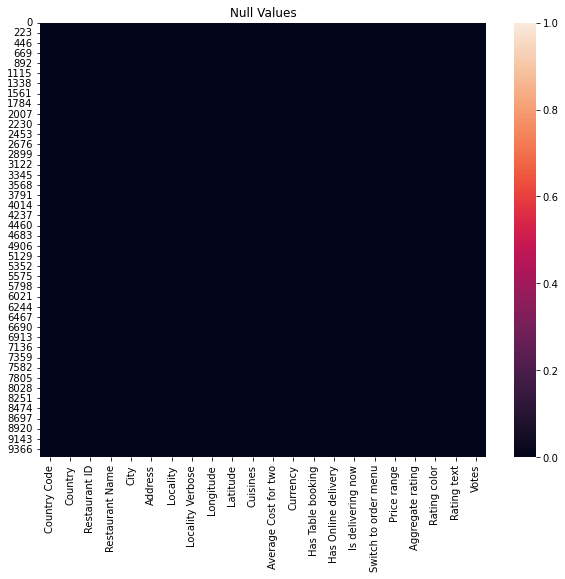

In [522]:
# heatmap on null values
plt.figure(figsize=[10,8])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

There are 9 null values in Cuisines the dataset ,lets process it

In [6]:
#since cuisines one restaurent cant be applied to another restaurent and the uniqueness of the restaurent cuisine dropping it null value datas
df.drop(df[df['Cuisines'].isnull()==True].index,inplace=True)

# EDA

In [7]:
df['Latitude'].nunique()

8668

In [ ]:
#We can observe there are 8668 unique values in the dataset

In [20]:
df['Longitude'].nunique()

8111

In [ ]:
#We can observe there are 8111 unique values in the dataset

In [8]:
#For better data in the model with relation joining both 'Latitude', 'Longitude' columns and creating new column
df['lat_longs'] = [', '.join(str(x) for x in y) for y in map(tuple, df[['Latitude', 'Longitude']].values)]

In [9]:
#we can drop the column since we have the clubbed data with us
df.drop(['Latitude','Longitude'],axis=1,inplace=True)

In [10]:
#we can drop the values in lat_longs with zero cannot be present in any locations and it better to drop than replacing it
df.drop(df[(df['lat_longs']=='0.0, 0.0')==True].index,inplace=True)

In [25]:
df['Country Code'].value_counts()

1      8157
216     425
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       20
166      20
184      20
191      19
37        4
Name: Country Code, dtype: int64

We can observe 15 unique Country Code in the dataset and the maximum count is in code 1 with 8157 and least in  Cod 37 with 4 in the column

we can drop the column Country Code since it is a code it has no relation in the model

In [27]:
df['Restaurant ID'].nunique()

9045

we can drop the column Restaurant ID since every row is unique in the dataset so it wont have relation in the model

In [11]:
df.drop('Restaurant ID',axis=1,inplace=True)

In [29]:
df['Average Cost for two'].value_counts()

500       832
300       825
400       791
200       639
600       618
250       437
350       431
700       388
150       342
100       338
800       322
450       319
1000      268
1500      184
550       181
25        174
650       173
1200      141
10        125
40        112
2000      106
900       105
1100       79
1400       76
1600       76
1800       68
750        66
1300       65
50         55
2500       54
850        52
3000       40
70         35
1700       31
2200       26
20         25
30         24
950        20
60         19
80         19
1250       17
35         17
120        15
1900       15
90         14
0          13
4500       13
4000       13
3500       13
5000       12
45         12
55         10
2100        9
1350        8
2400        8
1650        7
1550        6
230         6
160         6
200000      6
170         5
110         5
6000        5
3200        5
7           4
15          4
85          3
1750        3
3600        3
130         3
75          3
65    

We can observe 126 unique MinTemp in the dataset  The min value in the column Average Cost for two is 0 and max value is 8000 in the column

In [31]:
#duplicates removal
df.drop_duplicates(inplace=True)
df.shape

(9045, 20)

In [32]:
df['Price range'].value_counts()

1    4152
2    2966
3    1357
4     570
Name: Price range, dtype: int64

In [ ]:
#We can observe 4 unique Price range in the dataset and the maximum count is in 1 range with 4152 and least in 4 range with 570 in the column

In [33]:
df['Aggregate rating'].value_counts()

0.0    1864
3.2     506
3.1     494
3.4     480
3.3     472
3.5     461
3.6     445
3.0     442
3.7     415
3.8     382
2.9     373
3.9     320
2.8     313
4.1     266
4.0     258
2.7     250
4.2     214
2.6     191
4.3     169
4.4     139
2.5     110
4.5      94
2.4      87
4.6      76
4.9      60
2.3      46
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64

In [ ]:
#We can observe 33 unique Aggregate rating in the dataset The min value in the column Aggregate rating for two is 0 and max value is 4.9 in the column

In [34]:
df['Votes'].nunique()

1012

In [ ]:
#We can observe 1012 unique Votes  in the dataset The min value in the column Aggregate rating for two is 0 and max value is 1485in the column

In [35]:
df['Country'].value_counts()

India             8157
United States      425
United Kingdom      80
Brazil              60
South Africa        60
UAE                 60
New Zealand         40
Turkey              34
Australia           24
Phillipines         22
Indonesia           20
Qatar               20
Singapore           20
Sri Lanka           19
Canada               4
Name: Country, dtype: int64

In [ ]:
#We can observe 15 unique Country  in the dataset and the maximum count is in India   with 8157 and least in Canada  with 4 in the column

In [36]:
df['Restaurant Name'].nunique()

7020

In [37]:
df['Restaurant Name'].value_counts()

Domino's Pizza                                            78
Cafe Coffee Day                                           76
Subway                                                    61
Green Chick Chop                                          51
McDonald's                                                48
Keventers                                                 34
Pizza Hut                                                 29
Giani                                                     29
Baskin Robbins                                            28
Barbeque Nation                                           23
Giani's                                                   22
Barista                                                   22
Dunkin' Donuts                                            21
Costa Coffee                                              19
Pind Balluchi                                             19
Pizza Hut Delivery                                        19
Sagar Ratna             

In [ ]:
#We can observe 7020 unique Restaurant Name  in the dataset 

In [38]:
df['City'].nunique()

140

In [39]:
df['City'].value_counts()

New Delhi                 5240
Gurgaon                   1070
Noida                      987
Faridabad                  229
Ghaziabad                   25
Ahmedabad                   21
Cedar Rapids/Iowa City      20
Wellington City             20
Surat                       20
Columbus                    20
Boise                       20
Doha                        20
Pune                        20
Puducherry                  20
Singapore                   20
Waterloo                    20
Auckland                    20
Pensacola                   20
Valdosta                    20
Sioux City                  20
Dalton                      20
Sí£o Paulo                  20
Pocatello                   20
Athens                      20
Rio de Janeiro              20
Brasí_lia                   20
Davenport                   20
Des Moines                  20
Tampa Bay                   20
Cape Town                   20
Abu Dhabi                   20
Indore                      20
Manchest

In [ ]:
#We can observe 140 unique City  in the dataset The max  count in city is 5240 for New Delhi

In [40]:
df['Address'].value_counts()

Dilli Haat, INA, New Delhi                                                                                                              11
The Imperial, Janpath, New Delhi                                                                                                         9
Greater Kailash (GK) 1, New Delhi                                                                                                        9
Sector 41, Noida                                                                                                                         9
The Lalit, Barakhamba Avenue, Barakhamba Road, New Delhi                                                                                 8
Cyber Hub, DLF Cyber City, Gurgaon                                                                                                       8
Palate of Delhi, Dhaula Kuan Metro Station, Chanakyapuri, New Delhi                                                                      8
Food Court, 3rd Floor, Logi

In [41]:
df['Address'].nunique()

8460

In [ ]:
#we can observe 8460 unique address in the datset

In [42]:
df.shape

(9045, 20)

In [43]:
df['Locality'].value_counts()

Connaught Place                                        122
Rajouri Garden                                          98
Defence Colony                                          85
Malviya Nagar                                           85
Pitampura                                               83
Shahdara                                                81
Rajinder Nagar                                          79
Karol Bagh                                              75
Sector 18                                               75
Satyaniketan                                            75
Mayur Vihar Phase 1                                     73
Kalkaji                                                 71
Hauz Khas                                               71
Sector 62                                               70
Safdarjung                                              70
DLF Phase 3                                             68
Krishna Nagar                                           

In [44]:
df['Locality'].nunique()

1174

In [ ]:
#We can observe 1174 unique Locality  in the dataset and the maximum count is in Connaught Place   with 122 in the column

In [45]:
df['Locality Verbose'].value_counts()

Connaught Place, New Delhi                                          122
Rajouri Garden, New Delhi                                            98
Defence Colony, New Delhi                                            85
Malviya Nagar, New Delhi                                             84
Pitampura, New Delhi                                                 83
Shahdara, New Delhi                                                  81
Rajinder Nagar, New Delhi                                            79
Satyaniketan, New Delhi                                              75
Sector 18, Noida                                                     75
Karol Bagh, New Delhi                                                75
Mayur Vihar Phase 1, New Delhi                                       73
Hauz Khas, New Delhi                                                 71
Kalkaji, New Delhi                                                   71
Safdarjung, New Delhi                                           

In [82]:
df['Locality Verbose'].nunique()

1181

In [ ]:
#We can observe 1181 unique Locality Verbose  in the dataset and the maximum count is in Connaught Place, New Delhi  with 122 in the column

In [46]:
df['Cuisines'].value_counts()

North Indian                                                                                     877
North Indian, Chinese                                                                            477
Chinese                                                                                          337
Fast Food                                                                                        334
North Indian, Mughlai                                                                            322
Cafe                                                                                             280
Bakery                                                                                           193
North Indian, Mughlai, Chinese                                                                   190
Bakery, Desserts                                                                                 147
Street Food                                                                                

In [47]:
df['Cuisines'].nunique()

1755

In [ ]:
#we can observe 1755 unique cuisines in the datset and North Indian is having highest count of 877 in the column

In [48]:
df['Currency'].value_counts()

Indian Rupees(Rs.)        8157
Dollar($)                  473
Pounds(£)                  80
Brazilian Real(R$)          60
Rand(R)                     60
Emirati Diram(AED)          60
NewZealand($)               40
Turkish Lira(TL)            34
Botswana Pula(P)            22
Indonesian Rupiah(IDR)      20
Qatari Rial(QR)             20
Sri Lankan Rupee(LKR)       19
Name: Currency, dtype: int64

In [83]:
df['Currency'].nunique()

11

In [ ]:
#We can observe 11 unique Currency  in the dataset and the maximum count is in Indian Rupee   with 8157 and least in Sri Lankan Rupee  with 19 in the column

In [49]:
df['Has Table booking'].value_counts()

No     7904
Yes    1141
Name: Has Table booking, dtype: int64

In [ ]:
#We can observe 2 unique  Table booking  in the dataset and the maximum count is in No  with 7904 and least in Yes   with 1141 in the column

In [50]:
df['Has Online delivery'].value_counts()

No     6600
Yes    2445
Name: Has Online delivery, dtype: int64

In [ ]:
#We can observe 2 unique  Online delivery  in the dataset and the maximum count is in No  with 6600 and least in Yes   with 2445 in the column

In [51]:
df['Is delivering now'].value_counts()

No     9011
Yes      34
Name: Is delivering now, dtype: int64

In [ ]:
#We can observe 2 unique is Online delivery  in the dataset and the maximum count is in No  with 9011 and least in Yes   with 34 in the column

In [52]:
df['Switch to order menu'].value_counts()

No    9045
Name: Switch to order menu, dtype: int64

In [ ]:
#We can observe unique switch to order menu  in the dataset and the maximum count is 9045 .

In [53]:
df['Rating color'].value_counts()

Orange        3631
Yellow        2023
White         1864
Green         1046
Dark Green     296
Red            185
Name: Rating color, dtype: int64

In [ ]:
#We can observe 6 unique Rating color in the dataset and the maximum count of 3631 in Orange and least in Red with 185 count in the columns

In [54]:
df['Rating text'].value_counts()

Average      3631
Good         2023
Not rated    1864
Very Good    1046
Excellent     296
Poor          185
Name: Rating text, dtype: int64

In [ ]:
#We can observe 6 unique  Rating text in the dataset and the maximum count of 3631 in Average and least in Poor with 185 count in the columns

In [12]:
df.drop('Country Code',axis=1,inplace=True)

In [56]:
df.describe()

,Average Cost for two,Price range,Aggregate rating,Votes
count,9045.000000,9045.000000,9045.000000,9045.000000
mean,1228.666888,1.817026,2.729198,163.916307
std,16532.291566,0.909808,1.475842,440.551249
min,0.000000,1.000000,0.000000,0.000000
25%,250.000000,1.000000,2.600000,6.000000
50%,400.000000,2.000000,3.200000,33.000000
75%,700.000000,2.000000,3.700000,139.000000
max,800000.000000,4.000000,4.900000,10934.000000


In [ ]:
#We can observe high standard deviation for Average cost for two and votes
#no outliers present in the dataset

In [57]:
df.describe(include='O')

,Country,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Rating color,Rating text,lat_longs
count,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045,9045
unique,15,7020,140,8460,1174,1227,1755,12,2,2,2,1,6,6,8695
top,India,Domino's Pizza,New Delhi,"Dilli Haat, INA, New Delhi",Connaught Place,"Connaught Place, New Delhi",North Indian,Indian Rupees(Rs.),No,No,No,No,Orange,Average,"28.5743086, 77.3536634"
freq,8157,78,5240,11,122,122,877,8157,7904,6600,9011,9045,3631,3631,16


In [ ]:
#We can observe india is most data in the dataset
#Domino's Pizza has the highest freq of 78 in th dataset
#Connaught Place has the highest freq in loaclity
#north indaian and Indian Rupees has the highest freq  in dataset
#high freq for No classification in the datset
#Highest freq for Average rating color  in the dataset
#no outliers present in the dataset

In [13]:
#finding the continous value columns
con_col=[cont_col for cont_col in df.columns if df[cont_col].dtype!='object']
con_col



['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']

In [14]:
#finding the continous value columns
cat_col=[cat_col for cat_col in df.columns if df[cat_col].dtype=='object']
cat_col

['Country',
 'Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'lat_longs']

# Univariant Analysis

In [15]:
con_col.pop(1)

'Price range'

In [569]:
#Distribution plot for all numerical columns
def hist_plt(a):
    plt.title(con_col[a])
    sns.histplot(df[con_col[a]], bins = 10, color="indigo",kde=True)
    plt.xticks(rotation=90);

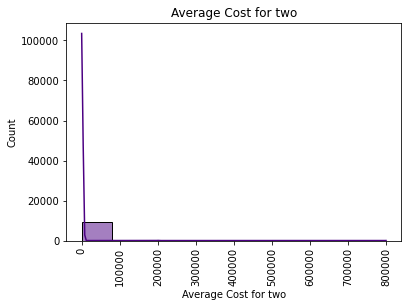

In [570]:
hist_plt(0)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

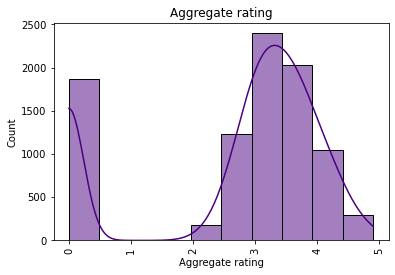

In [571]:
hist_plt(1)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

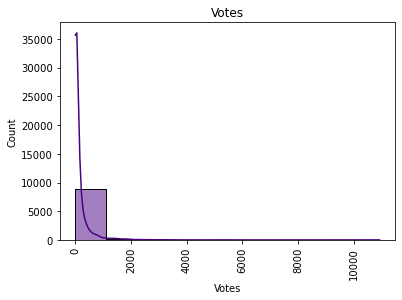

In [572]:
hist_plt(2)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

In [16]:
cat_col.append('Price range')

In [575]:
cat_col

['Country',
 'Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'lat_longs',
 'Price range']

In [18]:
#Distribution plot for all numerical columns
def count_plt(a):
    plt.figure(figsize = (12, 4))
    plt.title(cat_col[a])
    sns.countplot(cat_col[a],data=df)
    plt.xticks(rotation=90)
    plt.show()
    

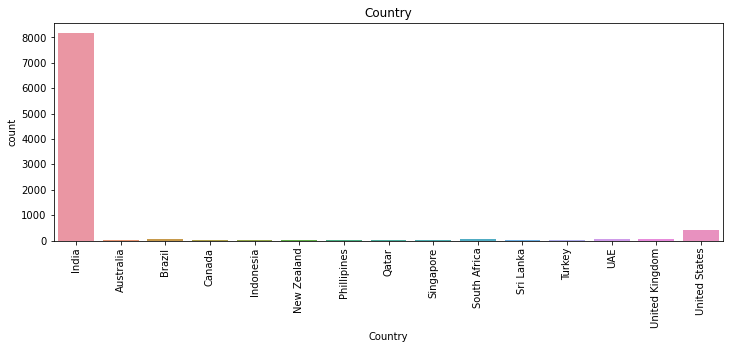

In [578]:
count_plt(0)

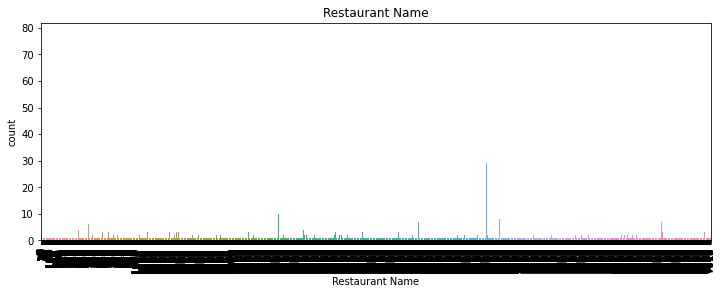

In [87]:
count_plt(1)

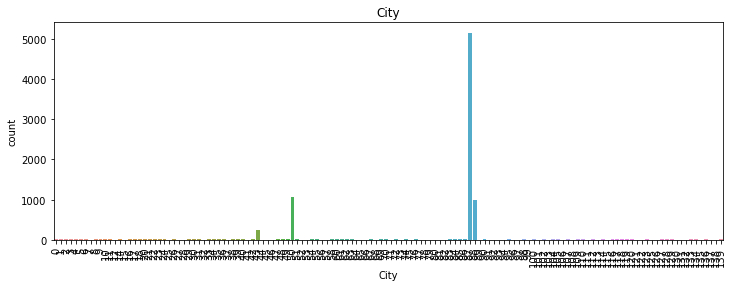

In [88]:
count_plt(2)

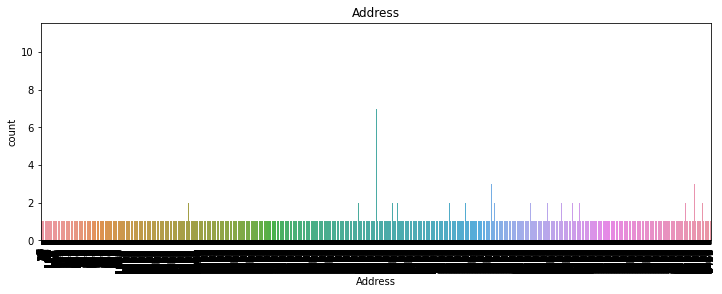

In [89]:
count_plt(3)

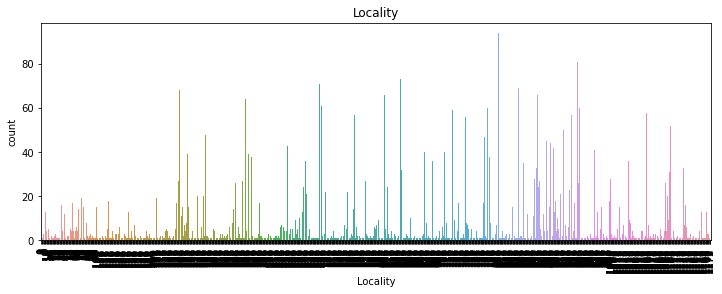

In [90]:
count_plt(4)

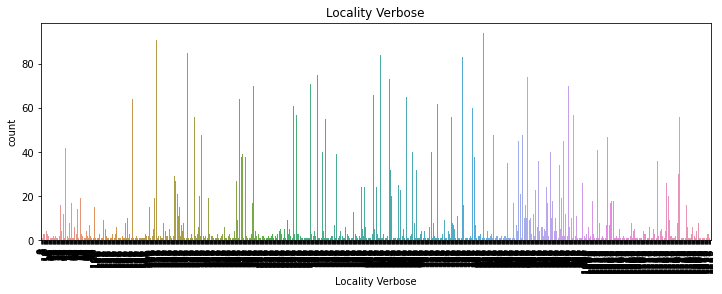

In [91]:
count_plt(5)

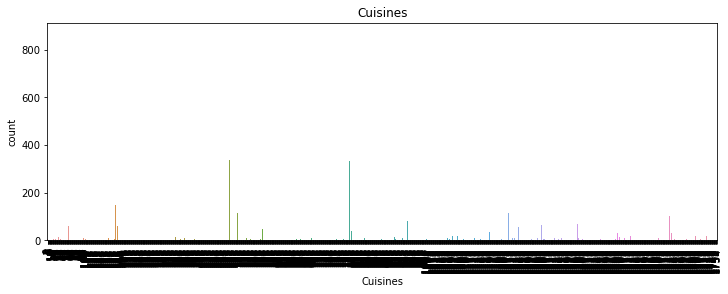

In [92]:
count_plt(6)

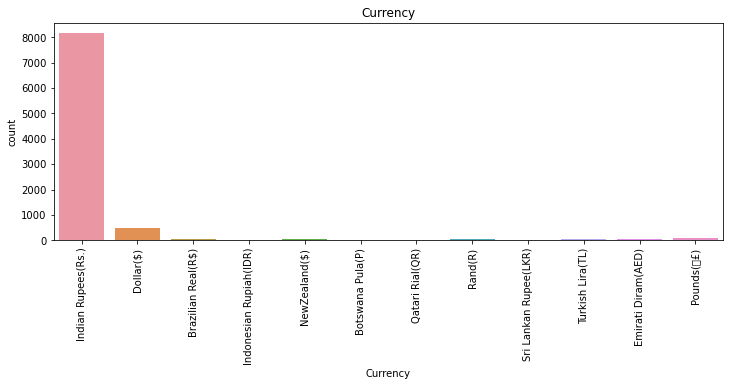

In [19]:
count_plt(7)

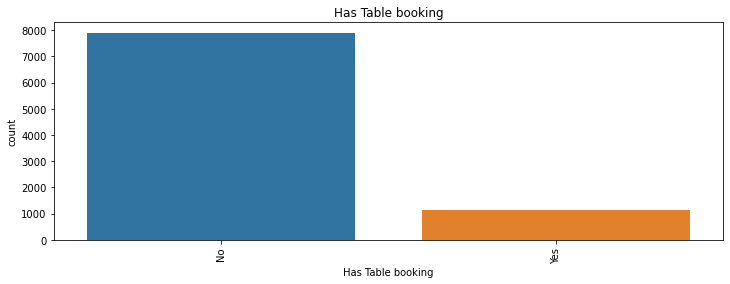

In [20]:
count_plt(8)

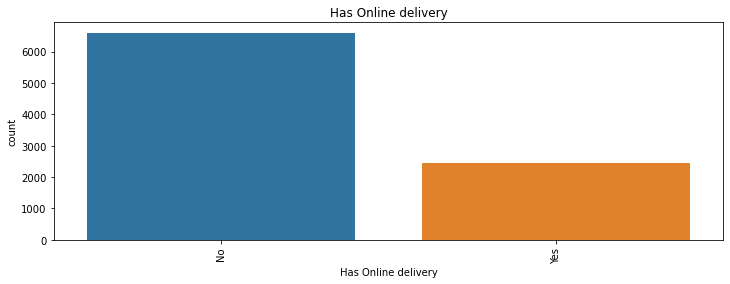

In [21]:
count_plt(9)

In [ ]:
In the Has Online delivery column we can see 

    the  No   has 6600 count in the column
    the  Yes has 2445 count in the column

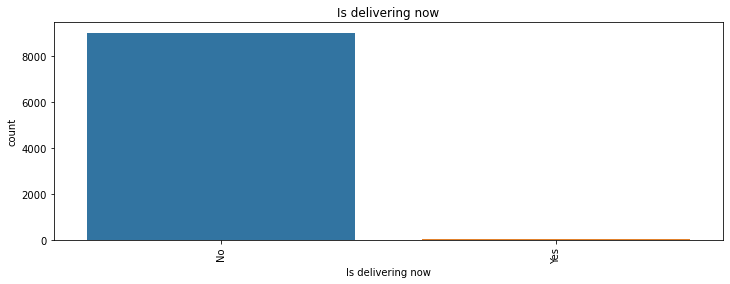

In [22]:
count_plt(10)

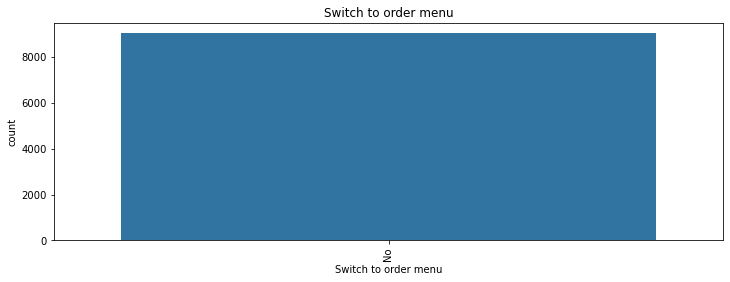

In [23]:
count_plt(11)

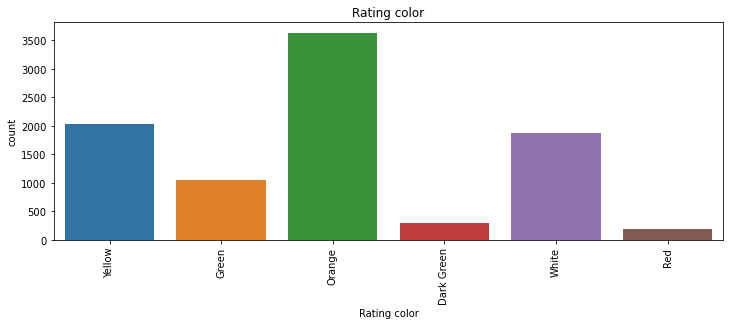

In [24]:
count_plt(12)

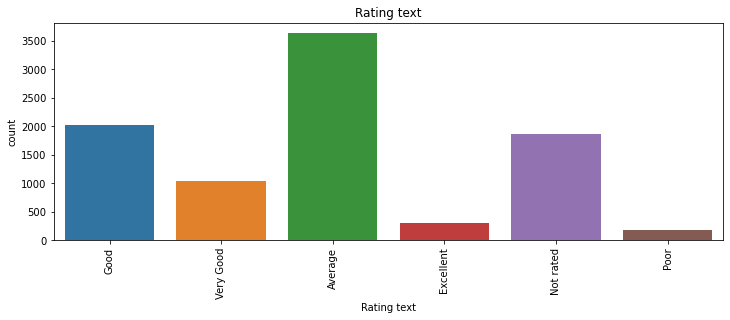

In [25]:
count_plt(13)

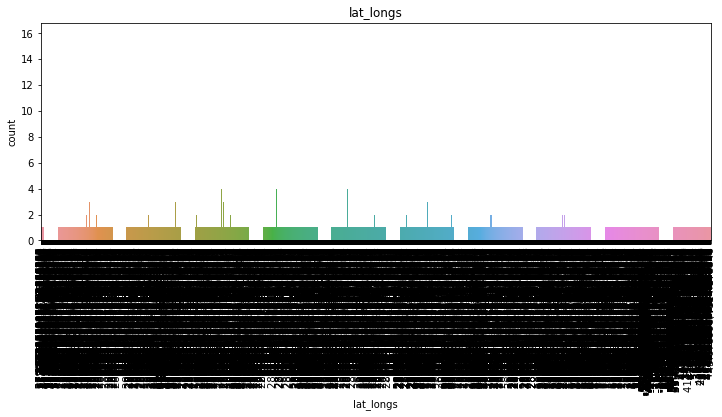

In [26]:
count_plt(14)

We can see large vast data in the column

# Bivariate Analysis

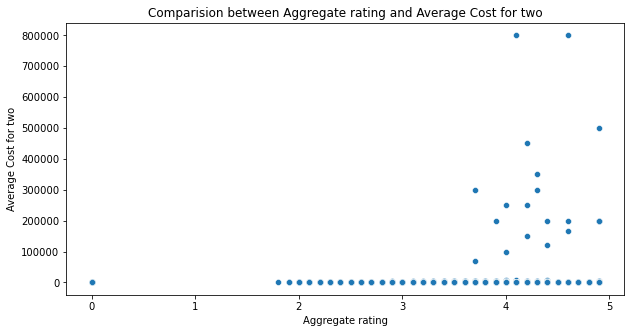

In [27]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Aggregate rating and Average Cost for two')
sns.scatterplot(df['Aggregate rating'],df['Average Cost for two']);

we can see scattered data and the Average cost for two increases in the dataset along the x axis in the range of 4 to 5 

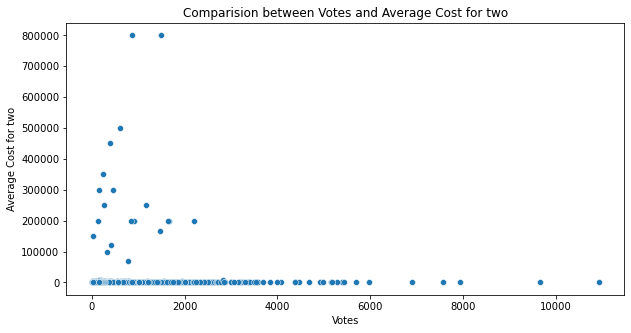

In [46]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Votes and Average Cost for two')
sns.scatterplot(df['Votes'],df['Average Cost for two']);

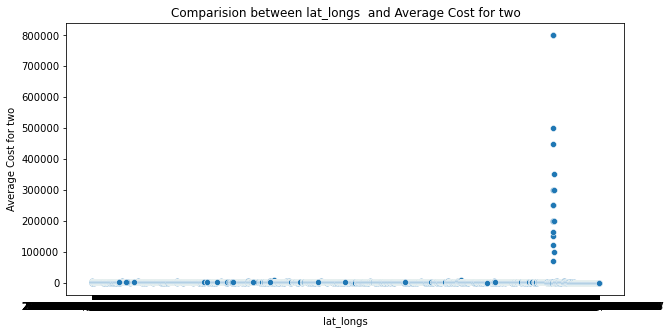

In [29]:
plt.figure(figsize=[10,5])
plt.title('Comparision between lat_longs  and Average Cost for two')
sns.scatterplot(df['lat_longs'],df['Average Cost for two']);

 We can see an increase in the Average cost for two only in one instance in the plot.data  is unevenly distributed in the dataset

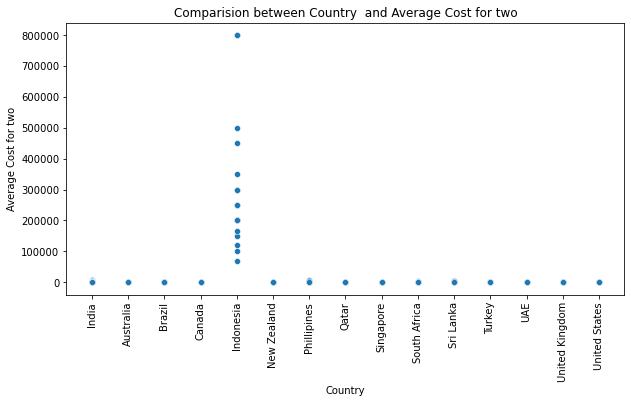

In [30]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Country  and Average Cost for two')
sns.scatterplot(df['Country'],df['Average Cost for two']);
plt.xticks(rotation=90);

 We can see an increase in Average cost in Indonesia compared to rest of the data in the dataset and data  is unevenly distributed in the dataset

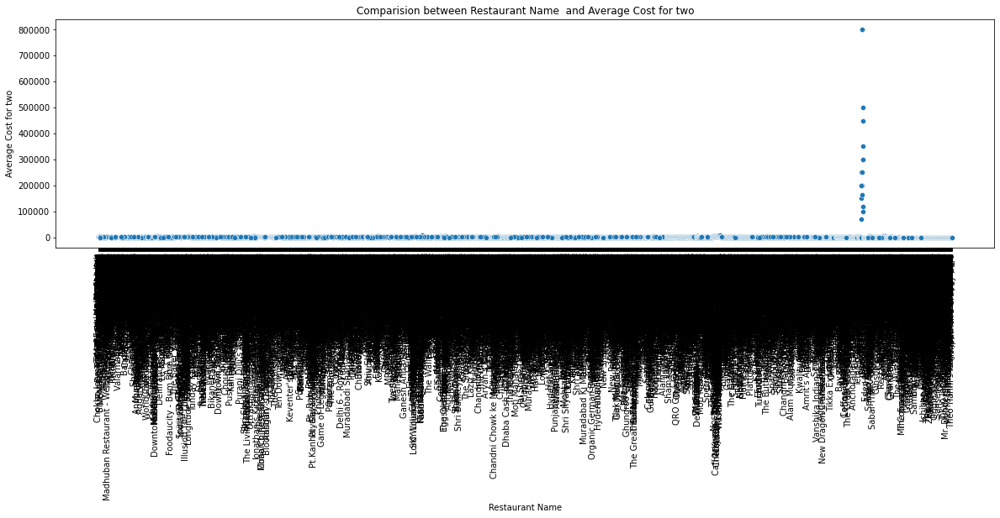

In [51]:
plt.figure(figsize=[20,5])
plt.title('Comparision between Restaurant Name  and Average Cost for two')
sns.scatterplot(df['Restaurant Name'],df['Average Cost for two']);
plt.xticks(rotation=90);

We can see small increase in the Average cost for two in one instance and rest of the range data  is unevenly distributed in the dataset

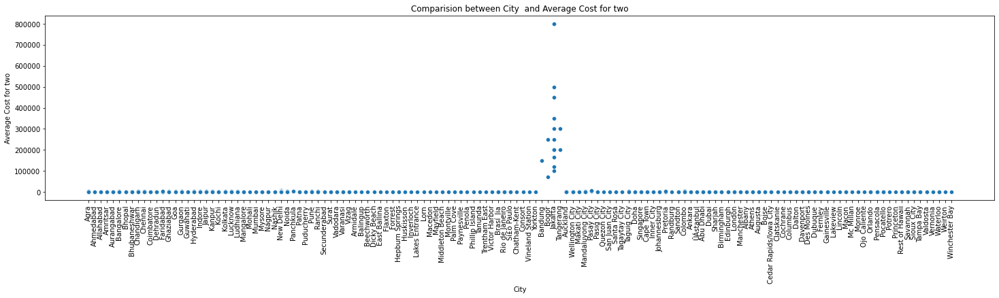

In [52]:

plt.figure(figsize=[25,5])
plt.title('Comparision between City  and Average Cost for two')
sns.scatterplot(df['City'],df['Average Cost for two']);
plt.xticks(rotation=90);


We can observe an increase in the Average cost for two in the cities Bandung,bogor,jakarta,Tangerang rest of the cities  data  is unevenly distributed in the dataset

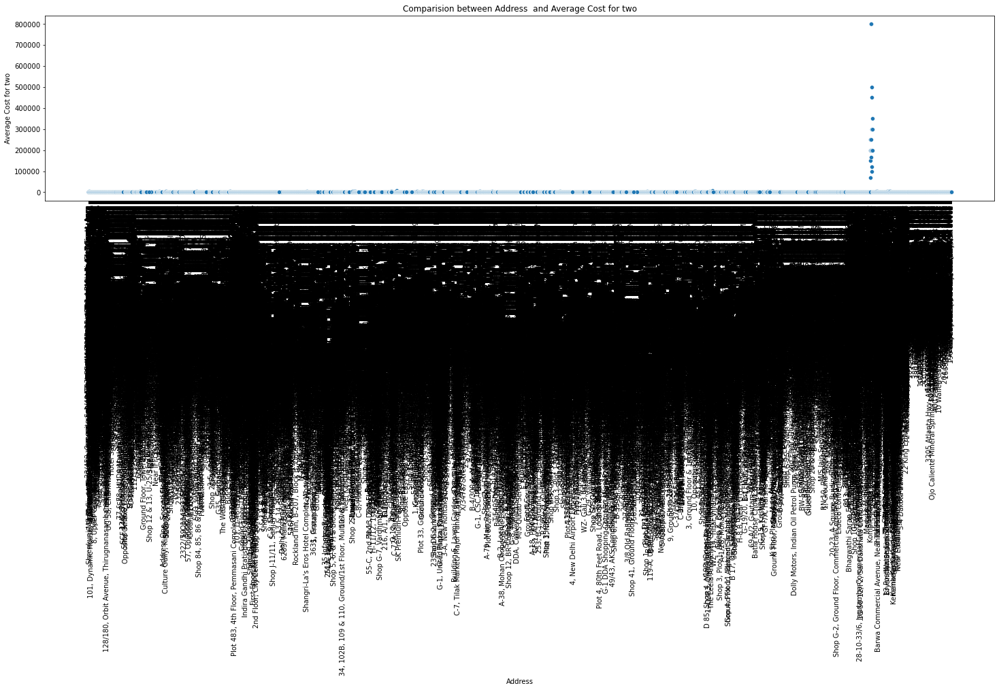

In [54]:

plt.figure(figsize=[25,5])
plt.title('Comparision between Address  and Average Cost for two')
sns.scatterplot(df['Address'],df['Average Cost for two']);
plt.xticks(rotation=90);

We can see small increase in the Average cost and it is entirely scattered in te plot

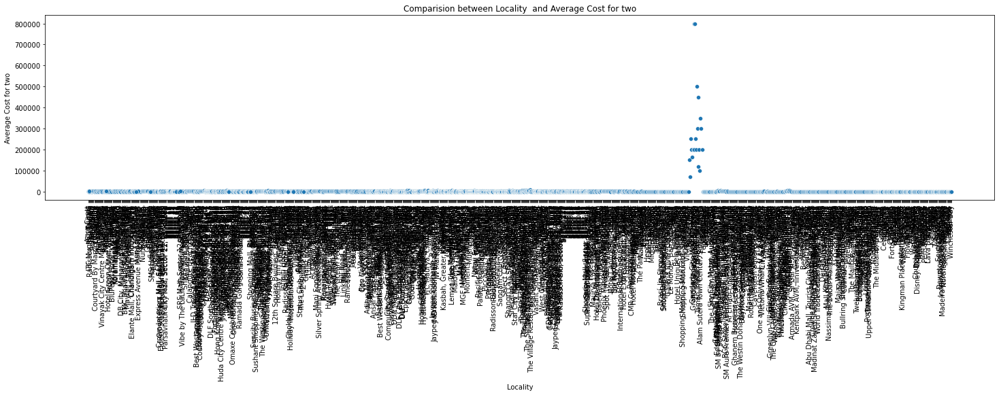

In [53]:

plt.figure(figsize=[25,5])
plt.title('Comparision between Locality  and Average Cost for two')
sns.scatterplot(df['Locality'],df['Average Cost for two']);
plt.xticks(rotation=90);

We can see small increase in the Average cost and data  is unevenly distributed in the dataset

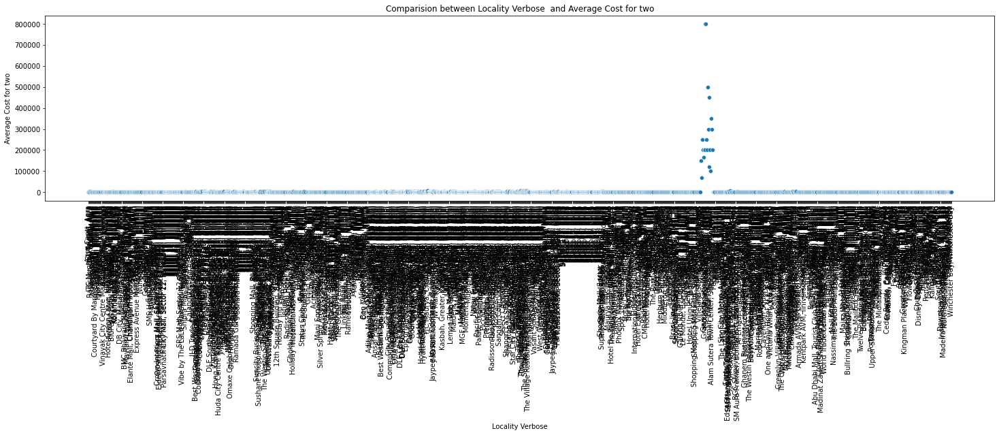

In [55]:

plt.figure(figsize=[25,5])
plt.title('Comparision between Locality Verbose  and Average Cost for two')
sns.scatterplot(df['Locality Verbose'],df['Average Cost for two']);
plt.xticks(rotation=90);

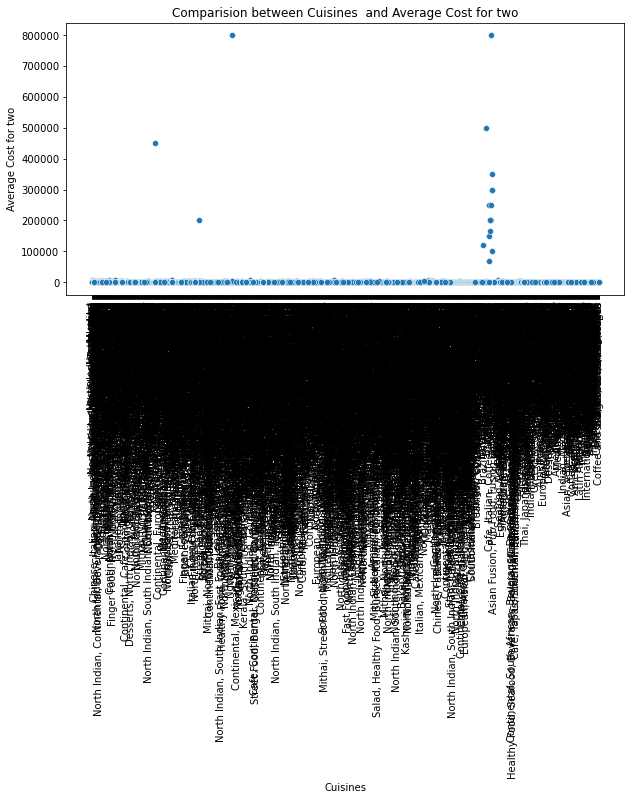

In [36]:

plt.figure(figsize=[10,5])
plt.title('Comparision between Cuisines  and Average Cost for two')
sns.scatterplot(df['Cuisines'],df['Average Cost for two']);
plt.xticks(rotation=90);




data is unevenly distributed in the dataset

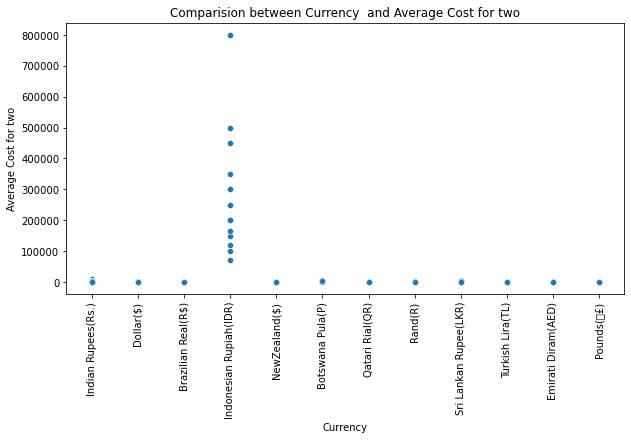

In [37]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Currency  and Average Cost for two')
sns.scatterplot(df['Currency'],df['Average Cost for two']);
plt.xticks(rotation=90);



In [ ]:
#we can see an increase in Average cost for two in Indonesian rupia and data  is unevenly distributed in the dataset in the rest

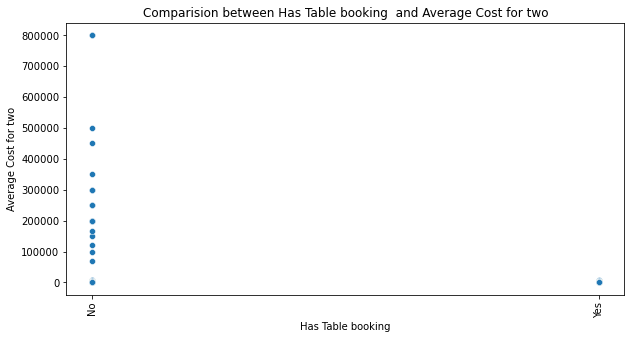

In [38]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Has Table booking  and Average Cost for two')
sns.scatterplot(df['Has Table booking'],df['Average Cost for two']);
plt.xticks(rotation=90);


We can see an increase in Average cost for Two when the table is not booked and itr can be varied in higher values as well and when the table is boooked we can see the  Average cost for Two is low.

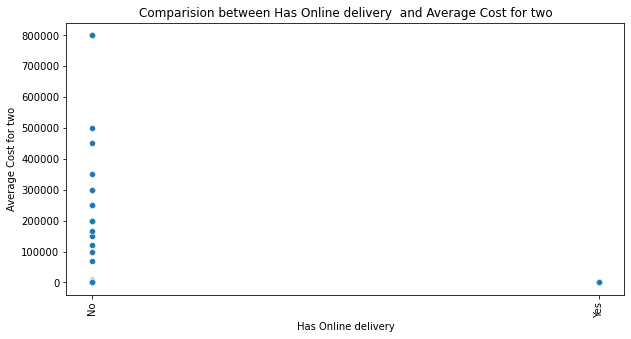

In [39]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Has Online delivery  and Average Cost for two')
sns.scatterplot(df['Has Online delivery'],df['Average Cost for two']);
plt.xticks(rotation=90);


We can see an increase in Average Cost for two when the Has Online delivery is No  and it is very less when it is yes.We can see large increase in Average cost  for No variable .

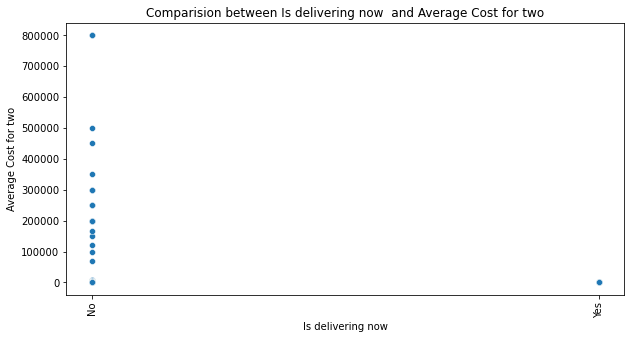

In [40]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Is delivering now  and Average Cost for two')
sns.scatterplot(df['Is delivering now'],df['Average Cost for two']);
plt.xticks(rotation=90);



We can see an increase in Average Cost for two when Is delivering now is No and it is very less when it is yes.We can see large increase in Average cost  for No variable .

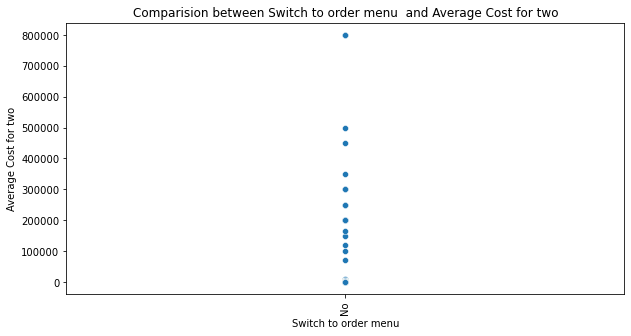

In [41]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Switch to order menu  and Average Cost for two')
sns.scatterplot(df['Switch to order menu'],df['Average Cost for two']);
plt.xticks(rotation=90);



We can see an increase in Average Cost for two when Switch to order menu is No  .We can see large increase in Average cost  for No variable .

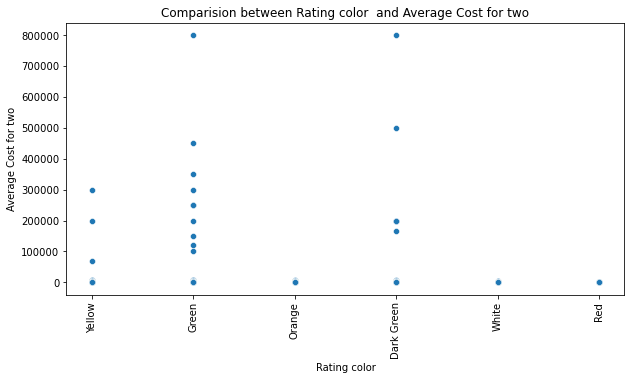

In [42]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Rating color  and Average Cost for two')
sns.scatterplot(df['Rating color'],df['Average Cost for two']);
plt.xticks(rotation=90);


We cans see the data it is unevenly distributed in the dataset along all the calssification but slight increase in Average cost for two in Green in the Rating color plot 

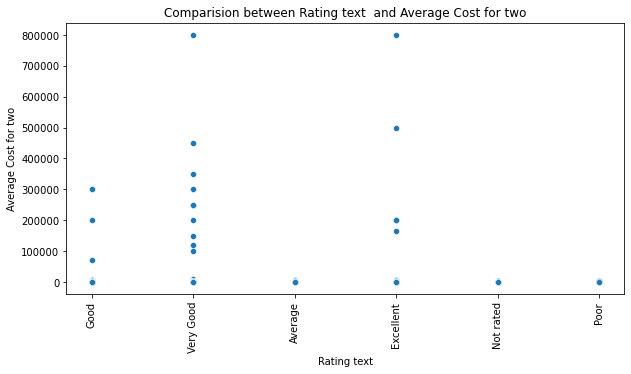

In [43]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Rating text  and Average Cost for two')
sns.scatterplot(df['Rating text'],df['Average Cost for two']);
plt.xticks(rotation=90);


We cans see the data it is unevenly distributed in the dataset along all the calssification but slight increase in Average cost for two in Verygood in the Rating Text plot

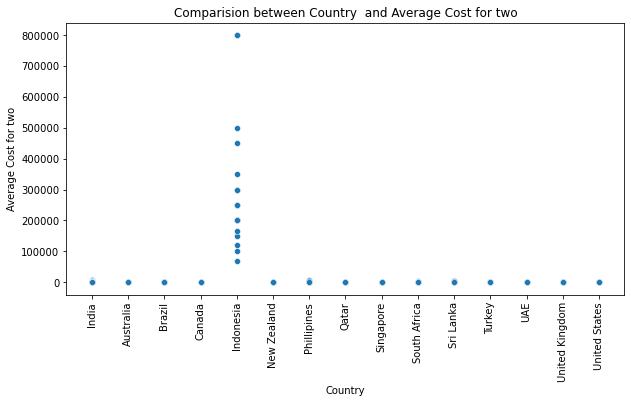

In [44]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Country  and Average Cost for two')
sns.scatterplot(df['Country'],df['Average Cost for two']);
plt.xticks(rotation=90);


We cans see the data it is unevenly distributed in the dataset along all the calssification but slight increase in Average cost for two in Indonesia in the country  plot

# Multivariate Analysis

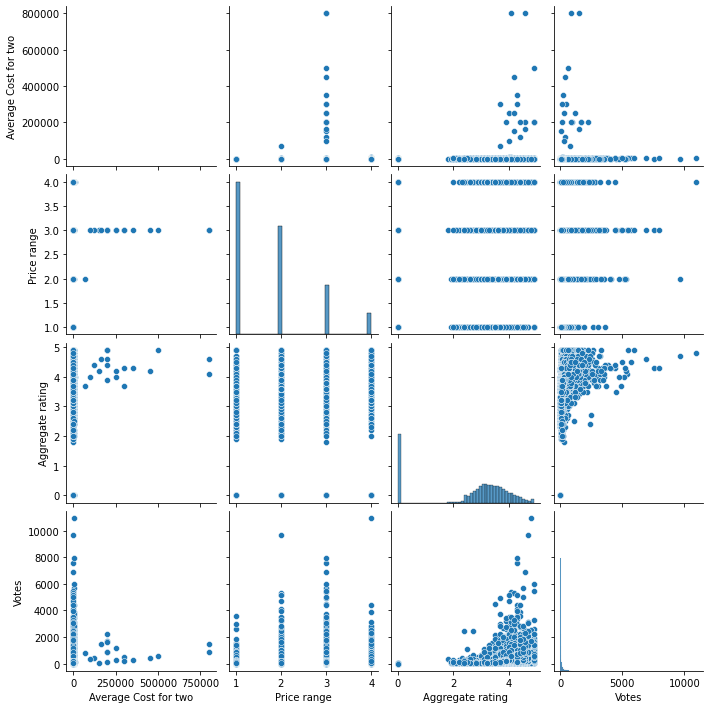

In [45]:
#pair ploting for df
sns.pairplot(df)

Above is the pair plot for the dataset,we can observe some outliers and skewness in the dataset 

# Encoding

In [61]:
#Creating list for Encoding the category column in the dataset

categ_col=['Country',
 'Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text']


In [62]:
#Encoding the columns using LabelEncoder

from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
df[categ_col]= df[categ_col].apply(LE.fit_transform)

In [63]:
df['lat_longs']= LE.fit_transform(df['lat_longs'])

In [641]:
df.shape

(8876, 19)

In [642]:
df.head(50)

,Country,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,lat_longs
0,3,2985,1,4327,15,15,1457,850,4,0,0,0,0,3,3.9,5,2,140,788
2,3,6532,1,5928,15,15,1257,500,4,0,0,0,0,2,3.6,5,2,94,786
3,3,1533,1,97,195,196,1581,400,4,0,0,0,0,2,4.0,1,5,87,793
4,3,4640,1,1269,195,196,1321,1000,4,0,0,0,0,3,4.2,1,5,177,794
6,3,4619,1,5397,438,444,1457,2500,4,0,0,0,0,4,4.3,1,5,133,787
7,3,5895,1,5397,438,444,1228,2500,4,0,0,0,0,4,4.0,1,5,41,787
9,3,1776,1,6822,801,811,1457,3600,4,0,0,0,0,4,3.8,5,2,46,791
10,3,6312,1,6822,801,811,1284,0,4,0,0,0,0,1,3.9,5,2,103,791
11,3,1769,1,6015,810,820,1647,550,4,0,0,0,0,2,4.1,1,5,121,792
12,3,6133,1,5344,1014,1063,1293,1100,4,0,0,0,0,3,3.4,2,0,70,785


In [589]:
len(con_col)

3

# Outliers Visualization

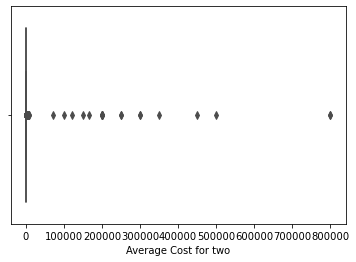

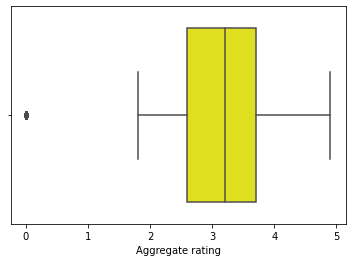

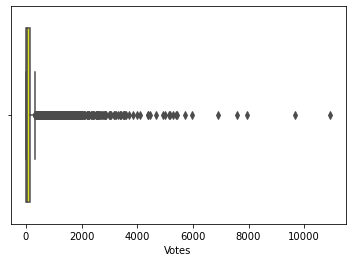

In [593]:
def bxplt(a):
    plt.figure()
    sns.boxplot(df[con_col[a]],data=df,color='yellow')
for i in range(0,3):
    bxplt(i)

We can observe outliers in the columns 'Average Cost for two', 'Aggregate rating', 'Votes' and we can ignore the outliers in the categorical data columns

In [594]:
con_col

['Average Cost for two', 'Aggregate rating', 'Votes']

In [64]:
#creating dataset for removing outliers in the dataset
feat=df[['Average Cost for two', 'Aggregate rating', 'Votes']]

In [65]:
#zscore
z1=np.abs(zscore(feat))
threshold=3

In [66]:
#printing the outliers points in the dataset

print(np.where(z1>3))

(array([  14,   83,   84,   85,   88,   92,   93,   96,  100,  152,  154,
        158,  160,  161,  162,  164,  168,  171,  462,  464,  478,  548,
        560,  561,  564,  565,  566,  568,  569,  571,  773,  863,  864,
       1151, 1156, 1561, 1563, 1565, 1568, 1572, 1575, 1661, 1665, 1668,
       1669, 1670, 1671, 1672, 1673, 1675, 1724, 1727, 1728, 1729, 1732,
       1734, 1736, 1739, 1743, 1868, 2112, 2230, 2233, 2238, 2241, 2243,
       2250, 2251, 2253, 2258, 2266, 2274, 2280, 2281, 2282, 2285, 2293,
       2300, 2305, 2308, 2310, 2318, 2319, 2320, 2326, 2332, 2335, 2337,
       2340, 2341, 2342, 2344, 2536, 2539, 2556, 2557, 2558, 2657, 2793,
       2794, 2804, 2806, 2810, 3155, 3162, 3163, 3165, 3171, 3172, 3173,
       3177, 3260, 3334, 3350, 3490, 3554, 3798, 3799, 3809, 3833, 4147,
       4166, 5234, 5401, 5736, 5777, 5785, 5788, 5914, 5982, 6053, 6088,
       6142, 6875, 7367, 7407, 8064, 8068, 8072, 8074, 8076, 8078, 8245,
       8246, 8247, 8248, 8248, 8249, 8250, 8251, 8

In [67]:
#saving the data without outlier points 
df_new_1=df[(z1<3).all(axis=1)]


In [68]:
#chcking df loss
df_loss=((df.shape[0]-df_new_1.shape[0])/df.shape[0])*100
print(df_loss)

1.9679380873410726


In [ ]:
#Since datasloss is less than 10% it is allowable

In [601]:
Q1=feat.quantile(.25)
Q3=feat.quantile(.75)

IQR=Q3-Q1


In [602]:
df_new_2=df[~(( df<(Q1-1.5*IQR ))|(df>(Q1+1.5*IQR))).any(axis=1)]

In [603]:
df_new_2.shape

(4700, 19)

In [604]:
((df.shape[0])-(df_new_2.shape[0]))/(df.shape[0])*100

48.08924232383477

high data loss so we cannot loose this much data loss in IQR method

In [605]:
df.shape

(9054, 19)

In [70]:
#Updataing the dataset with out outliers
df=df_new_1

In [71]:
df.shape

(8867, 19)

In [ ]:
#visualizing skewness in continous features

In [610]:
#distribution plot

def dtp(a):
    plt.figure()
    sns.distplot(df[con_col[a]],color='brown',bins=5)
    

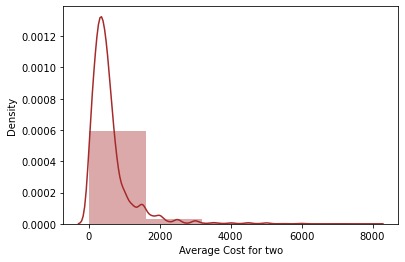

In [611]:
dtp(0)

In [ ]:
#the data looks right skewed and teh building block is out of the normalized curve

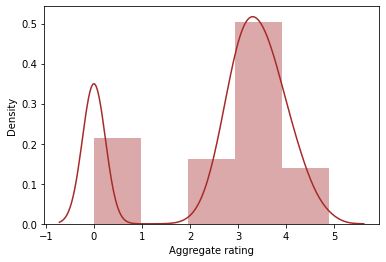

In [612]:
dtp(1)

In [ ]:
#the data looks  skewed and teh building block is out of the normalized curve

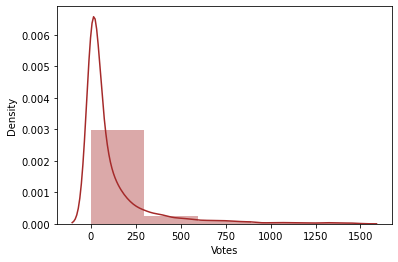

In [613]:
dtp(2)

In [ ]:
#the data looks right skewed and teh building block is out of the normalized curve

In [659]:
#initialising X and y
X=df.drop(['Average Cost for two'],axis=1)
y=df['Average Cost for two']

In [660]:
X.skew()

Country                  3.213098
Restaurant Name          0.050239
City                    -1.215594
Address                 -0.045148
Locality                -0.239318
Locality Verbose        -0.168305
Cuisines                -0.310642
Currency                 2.802709
Has Table booking        2.310092
Has Online delivery      1.039864
Is delivering now       16.067044
Switch to order menu     0.000000
Price range              0.914096
Aggregate rating        -1.033450
Rating color             0.092755
Rating text              0.484557
Votes                    3.186648
lat_longs                0.009853
dtype: float64

In [661]:
cont_col=['Aggregate rating','Votes','Price range']

In [662]:
X[cont_col].skew()


Aggregate rating   -1.033450
Votes               3.186648
Price range         0.914096
dtype: float64

In [663]:
#creating a list for removing skewness in the data
features=['Aggregate rating','Votes','Price range']

In [664]:
#aremoving skewness
X[features]=PowerTransformer(method='yeo-johnson').fit_transform(X[features])

In [665]:
#checking the updated Skewness
X[features].skew()

Aggregate rating   -0.612672
Votes              -0.024800
Price range         0.187285
dtype: float64

<AxesSubplot:xlabel='Aggregate rating', ylabel='Density'>

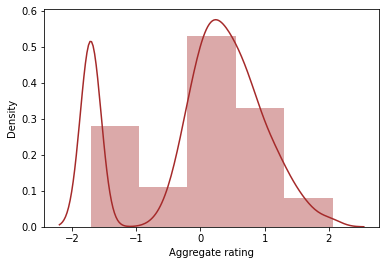

In [666]:
sns.distplot(X['Aggregate rating'],color='brown',bins=5)

In [670]:
features=['Aggregate rating']

In [671]:
X[features]=PowerTransformer(method='yeo-johnson').fit_transform(X[features])

In [676]:
X['Aggregate rating'].skew()

0.046050074420172955

In [57]:
#the skewness in the dataset is removed completely

# Checking For Multicollinearity

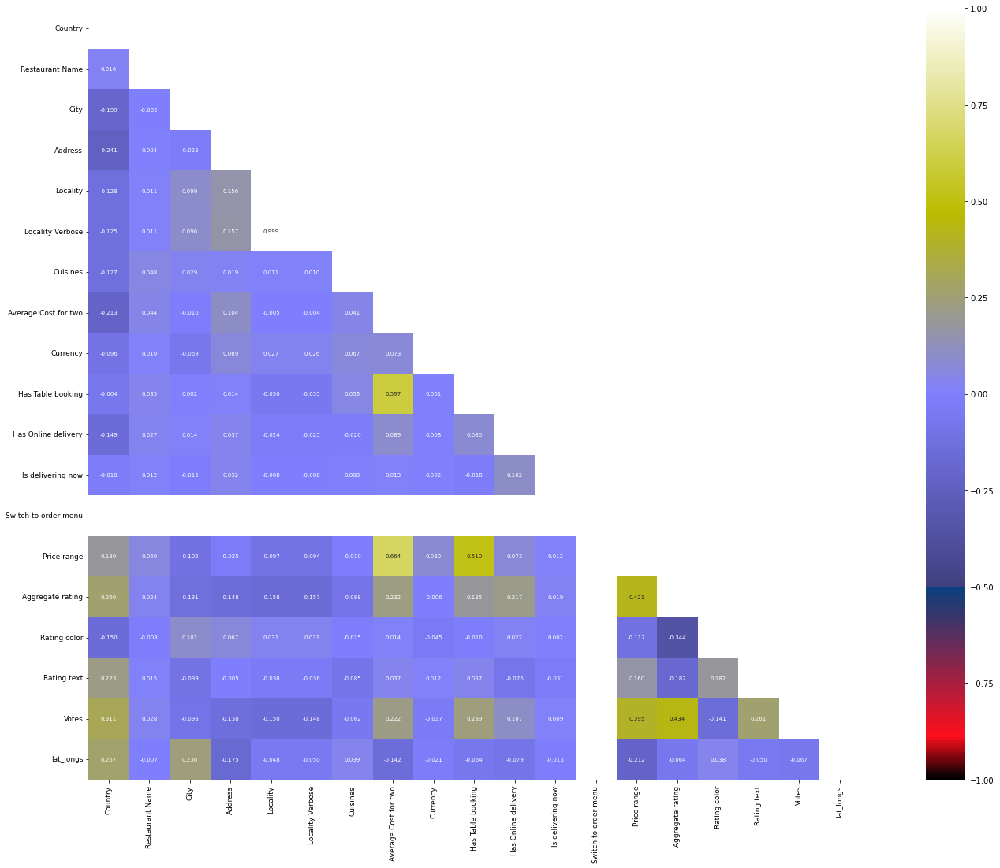

In [678]:
df_cor=df.corr()
upper_triangle = np.triu(df_cor)
plt.figure(figsize=(30,18))
sns.heatmap(df_cor, vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':7}, cmap="gist_stern", mask=upper_triangle)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.show()

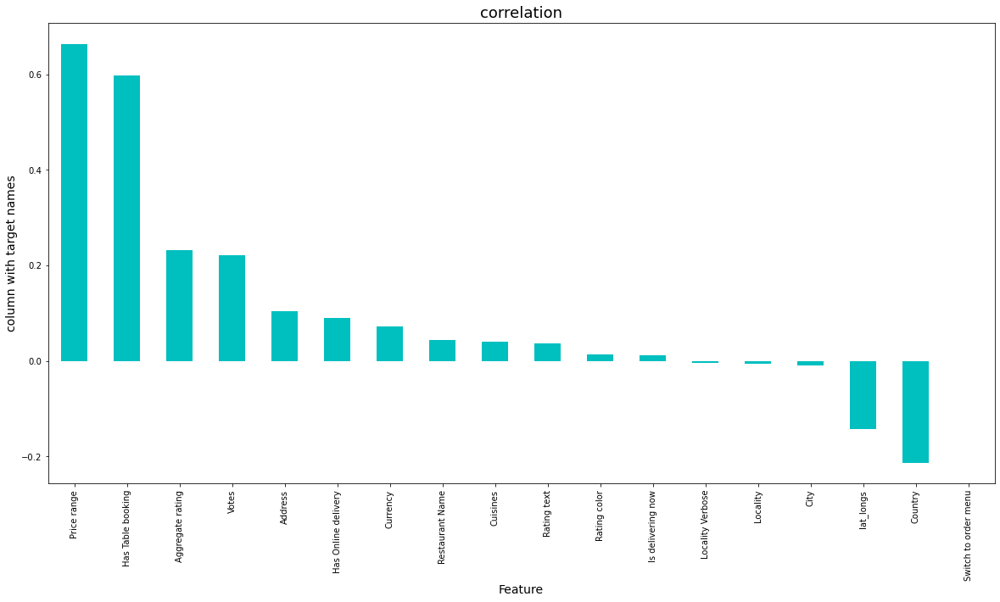

In [679]:
plt.figure(figsize=(20,10))
df.corr()['Average Cost for two'].sort_values(ascending=False).drop(['Average Cost for two']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

# Scaling the data

In [680]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

In [681]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
1,1.007401,Restaurant Name
10,1.014192,Is delivering now
7,1.040868,Currency
6,1.051115,Cuisines
3,1.129789,Address
15,1.152408,Rating text
2,1.184012,City
9,1.201631,Has Online delivery
14,1.246162,Rating color
17,1.331576,lat_longs


In [ ]:
#the vif is more than 10.lets drop the the column iteratively for removing multicollinearity.

In [683]:
#droping the highest multicollinear feature
X.drop('Locality',axis=1,inplace=True)

In [ ]:
#checking the updated feature for Multicollinearity

In [684]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
1,1.007395,Restaurant Name
9,1.014190,Is delivering now
6,1.040111,Currency
5,1.050872,Cuisines
4,1.066787,Locality Verbose
3,1.128494,Address
14,1.152343,Rating text
2,1.176827,City
8,1.200622,Has Online delivery
13,1.245569,Rating color


the vif values are less than 10.So multicollinearity is removed

# Model Building

In [685]:
#finding best random_state
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.25,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    r2=r2_score(y_test,predrf)
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)


Best accuracy is  0.63746089856175  on random_state  177


In [686]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.25,random_state=maxRS)

In [687]:
#shapes of x and y (train,test)
x_train.shape

(6657, 17)

In [688]:
#shape of test features
x_test.shape

(2219, 17)

In [689]:
#shape of train features
y_train.shape

(6657,)

In [690]:
#shape of test label
y_test.shape

(2219,)

In [691]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor

In [692]:
# different algorithm going to use

lr=LinearRegression()
ls=Lasso()
Rd=Ridge()
dtr=DecisionTreeRegressor()
rfr=RandomForestRegressor()
knn=KNeighborsRegressor()
adr=AdaBoostRegressor()
gbr=GradientBoostingRegressor()
xgbr=XGBRegressor()
etr=ExtraTreesRegressor()

In [693]:
#code for Training and Prediction for other models

def eval(x):
    mod=x
    print(mod)
    #training the data
    mod.fit(x_train,y_train)
    #Predicting the data
    pred_train=mod.predict(x_train)
    pred=mod.predict(x_test)
    
    print("r2_score for train data is {:.2f}%".format(r2_score(y_train,pred_train)*100))
    print("\n")
    print("r2_score for  test data is  {:.2f}%".format(r2_score(y_test,pred)*100))
    
    print("\n")
    print("Error")
    print("mean absolute error : ",mean_absolute_error(y_test,pred))
    print("mean squared error : ",mean_squared_error(y_test,pred))
    print("mean squared error is: ",np.sqrt(mean_squared_error(y_test,pred)))
    plt.scatter(x=y_test,y=pred,color='r')
    plt.plot(y_test,y_test,color='b')


LinearRegression()
r2_score for train data is 55.97%


r2_score for  test data is  63.75%


Error
mean absolute error :  195.86533090801805
mean squared error :  109954.29590060835
mean squared error is:  331.5935703547467


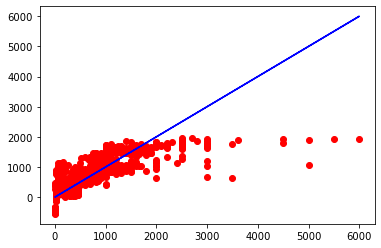

In [694]:
#calling linear model
eval(lr)

DecisionTreeRegressor()
r2_score for train data is 100.00%


r2_score for  test data is  74.09%


Error
mean absolute error :  129.57278053177106
mean squared error :  78576.17845876521
mean squared error is:  280.31442784624056


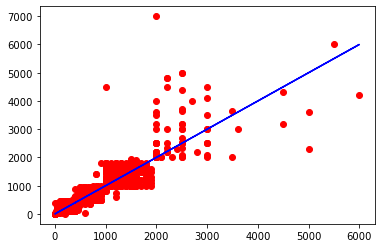

In [695]:
#calling DecisionTreeRegressor model
eval(dtr)

RandomForestRegressor()
r2_score for train data is 98.23%


r2_score for  test data is  89.07%


Error
mean absolute error :  98.71689499774672
mean squared error :  33161.33996876972
mean squared error is:  182.10255343835715


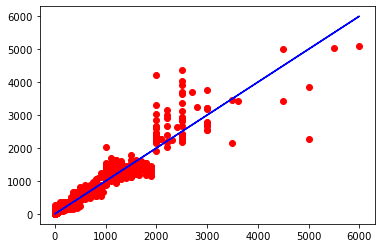

In [696]:
# RandomForestRegressor model
eval(rfr)

AdaBoostRegressor()
r2_score for train data is 56.57%


r2_score for  test data is  46.18%


Error
mean absolute error :  333.03972597718194
mean squared error :  163243.0938306603
mean squared error is:  404.0335305771791


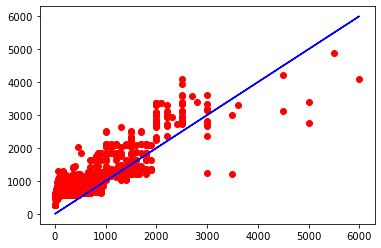

In [697]:
#calling AdaBoostRegressor model
eval(adr)

GradientBoostingRegressor()
r2_score for train data is 89.55%


r2_score for  test data is  87.17%


Error
mean absolute error :  113.95008966031399
mean squared error :  38900.09503856665
mean squared error is:  197.2310701653435


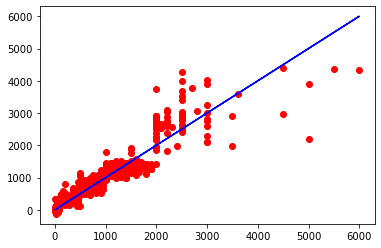

In [698]:
#calling GradientBoostingRegressor model
eval(gbr)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=None,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, reg_lambda=None, ...)
r2_score for train data is 98.67%


r2_score for  test data is  87.47%


Error
mean absolute error :  106.01410494317015
mean squared error :  38008.33227224085
mean squared error is:  194.95725755211282


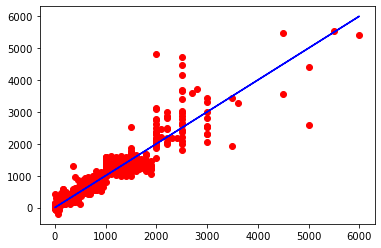

In [699]:
#calling XGBRegressor model
eval(xgbr)

ExtraTreesRegressor()
r2_score for train data is 100.00%


r2_score for  test data is  86.22%


Error
mean absolute error :  104.94040558810275
mean squared error :  41782.5436282109
mean squared error is:  204.40778759188922


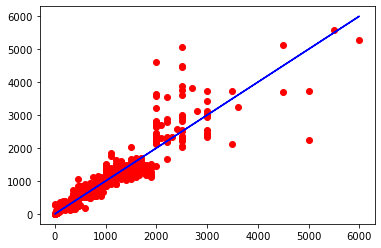

In [700]:
#calling ExtraTreesRegressor model
eval(etr)

KNeighborsRegressor()
r2_score for train data is 78.90%


r2_score for  test data is  69.75%


Error
mean absolute error :  164.02676881478143
mean squared error :  91733.36845425867
mean squared error is:  302.8751697552288


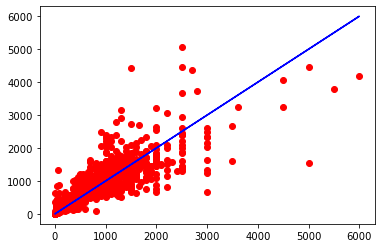

In [701]:
#calling KNeighborsRegressor model
eval(knn)

In [702]:
from sklearn.model_selection import KFold

In [703]:
from numpy import absolute
model=[lr,dtr,rfr,adr,gbr,xgbr,etr,knn]
for m in model:
    cv=KFold(n_splits=5,random_state=1,shuffle=True)
    score=cross_val_score(m,X,y,cv=cv,scoring="r2")
    print(m,"Cross val score is ",score*100)
    score=absolute(score)
    print("mean is ",score.mean()*100,"\n\n")

LinearRegression() Cross val score is  [57.46606499 59.97141526 60.61724548 55.62643372 54.46666102]
mean is  57.62956409248675 


DecisionTreeRegressor() Cross val score is  [73.70517787 78.05285846 77.98086492 83.61386741 79.18066264]
mean is  78.50668625867729 


RandomForestRegressor() Cross val score is  [86.76365492 88.07275246 89.7957716  88.43009165 85.27508743]
mean is  87.6674716119403 


AdaBoostRegressor() Cross val score is  [27.93559426 45.51570489 41.98751756 68.59129385 63.55258602]
mean is  49.516539315369315 


GradientBoostingRegressor() Cross val score is  [85.32025463 88.39371803 88.36549699 85.41566002 82.92289919]
mean is  86.08360577208819 


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interactio

In [705]:
from numpy import absolute
model=[ls,Rd]
for m in model:
    cv=KFold(n_splits=5,random_state=1,shuffle=True)
    score=cross_val_score(m,X,y,cv=cv,scoring="r2")
    print(m,"Cross val score is ",score*100)
    score=absolute(score)
    print("mean is ",score.mean()*100,"\n\n")

Lasso() Cross val score is  [57.41752878 60.00374268 60.64305969 55.59158414 54.4731212 ]
mean is  57.625807296597806 


Ridge() Cross val score is  [57.46556424 59.97254482 60.61760677 55.62614827 54.46639547]
mean is  57.62965191390992 




In [ ]:
error


XGBRegressor model has the least difference  between  test accuracy and cross validation score of 0.512%

In [706]:
hyperparameter_grid = {
                        'booster':['gbtree','gblinear'],
                       'n_estimators': [100, 200, 300, 400, 500],
                        'max_depth': [2, 3, 5, 10, 15],
                        'learning_rate': [0.05, 0.1, 0.15, 0.20],
                        'min_child_weight': [1, 2, 3, 4]
                      }


In [707]:
from sklearn.model_selection import GridSearchCV

grid_sear= GridSearchCV(estimator=xgbr,param_grid=hyperparameter_grid,cv= 5,n_jobs=-1)

In [708]:
grid_sear.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    callbacks=None, colsample_bylevel=1,
                                    colsample_bynode=1, colsample_bytree=1,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    gamma=0, gpu_id=-1, grow_policy='depthwise',
                                    importance_type=None,
                                    interaction_constraints='',
                                    learning_rate=0.300000012, max_bin=256,
                                    max_cat...
                                    max_depth=6, max_leaves=0,
                                    min_child_weight=1, missing=nan,
                                    monotone_constraints='()', n_estimators=100,
                                    n_jobs=0, num_parallel_tree=1,
                                    predictor='auto', random_state=0,
                                    reg_alpha=0, reg_lambda=1, ...),
             n_jobs=-1,
             param_grid={'booster': ['gbtree', 'gblinear'],
                         'learning_rate': [0.05, 0.1, 0.15, 0.2],
                         'max_depth': [2, 3, 5, 10, 15],
                         'min_child_weight': [1, 2, 3, 4],
                         'n_estimators': [100, 200, 300, 400, 500]})

In [710]:
grid_sear.best_params_

{'booster': 'gbtree',
 'learning_rate': 0.05,
 'max_depth': 10,
 'min_child_weight': 3,
 'n_estimators': 100}

In [711]:
h_xgbr=XGBRegressor(booster='gbtree',  n_estimators=100,  max_depth=10,  learning_rate=0.05,  min_child_weight=3)


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=None,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
             max_leaves=None, min_child_weight=3, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, reg_lambda=None, ...)
r2_score for train data is 98.43%


r2_score for  test data is  87.88%


Error
mean absolute error :  99.12552005552182
mean squared error :  36770.88419378715
mean squared error is:  191.75735760013785


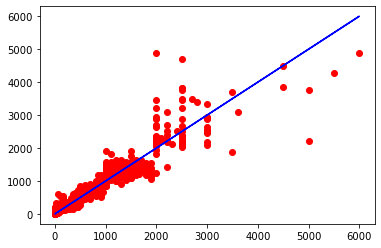

In [712]:
#calling XGBRegressor
eval(h_xgbr)

# The hyper parameter tuning of XGBRegressor gives actual accuracy of 87.47 % and cross val of  86.95%. Since there is accuracy increase  for hypertuned parameter with 87.88%. The hypertuned model of XGBRegressor algorithm is selected for final output.

In [713]:
joblib.dump(h_xgbr,"Average_Cost_for_two.obj")

['Average_Cost_for_two.obj']

In [714]:
#Lets Check loading the file 

Average_Cost_for_two_prediction=joblib.load("Average_Cost_for_two.obj")

In [715]:
pred=h_xgbr.predict(x_test)
Conclusion=pd.DataFrame([Average_Cost_for_two_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

After Training and Testing ten algorithm model. The best accuracy model was determined as XGBRegressor  (hypertuned model) with 87.88% true accuracy after all the data cleaning, pre-processing, training and prediction as well as evaluation phase

# predicting  Price range

In [58]:
data=pd.merge(data1,data2)

In [6]:
data.Cuisines.isnull().sum()

9

In [ ]:
#There are 9 null values in Cuisines the dataset ,lets process it

In [59]:

(data[(data['Cuisines'].isnull())==True].index)

Int64Index([9119, 9122, 9129, 9323, 9347, 9363, 9384, 9430, 9467], dtype='int64')

In [6]:
#since cuisines one restaurent cant be applied to another restaurent and the uniqueness of the restaurent cuisine dropping it null value datas

data.drop(data[data['Cuisines'].isnull()==True].index,inplace=True)

In [61]:
data.isnull().sum()

Country Code            0
Country                 0
Restaurant ID           0
Restaurant Name         0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [ ]:
Removed the null values completely from the dataset

# EDA

In [10]:
data['Latitude'].nunique()

8668

In [ ]:
#We can observe there are 8668 unique values in the dataset

In [11]:
data['Longitude'].nunique()

8111

In [ ]:
#We can observe there are 8111 unique values in the dataset

In [62]:
#For better data in the model with relation joining both 'Latitude', 'Longitude' columns and creating new column
data['lat_longs'] = [', '.join(str(x) for x in y) for y in map(tuple, data[['Latitude', 'Longitude']].values)]

In [63]:
#we can drop the column since we have the clubbed data with us
data.drop(['Latitude','Longitude'],axis=1,inplace=True)

In [15]:
data['Country Code'].value_counts()

1      8652
216     425
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: Country Code, dtype: int64

In [ ]:
#We can observe 15 unique Country Code in the dataset and the maximum count is in code 1 with 8157 and least in Cod 37 with 4 in the column

In [ ]:
#we can drop the column Country Code since it is a code it has no relation in the mode

In [16]:
data['Country Code'].unique()

array([  1,  14,  30,  37,  94, 148, 162, 166, 184, 189, 191, 208, 214,
       215, 216], dtype=int64)

In [17]:
data.shape

(9542, 21)

we can drop the column Country Code since it is a code it has no relation in the model

In [741]:
data['Restaurant ID'].nunique()

9542

we can drop the column Restaurant ID since every row is unique in the dataset so it wont have relation in the model

In [64]:
data.drop('Restaurant ID',axis=1,inplace=True)

In [743]:
data['Average Cost for two'].value_counts()

500       900
300       897
400       857
200       687
600       652
250       461
350       457
700       403
150       367
100       353
800       347
450       335
1000      281
1500      190
550       183
650       177
25        174
1200      145
10        125
40        112
2000      110
900       109
1100       80
1600       78
1400       78
1300       68
1800       68
750        68
50         55
850        55
2500       54
3000       41
70         35
1700       31
2200       27
20         25
30         24
950        21
80         19
60         19
35         17
1250       17
120        17
1900       16
0          15
90         14
4000       13
4500       13
3500       13
45         12
5000       12
2100       10
55         10
1650        8
2400        8
1350        8
230         6
160         6
1550        6
200000      6
170         5
3200        5
110         5
6000        5
7           4
15          4
270         3
2300        3
2700        3
1750        3
85          3
75    

We can observe 126 unique MinTemp in the dataset The min value in the column Average Cost for two is 0 and max value is 8000 in the column

In [744]:
data.shape

(9542, 20)

In [10]:
#duplicates removal
data.drop_duplicates(inplace=True)


In [20]:
data.shape

(9542, 20)

In [749]:
data['Price range'].value_counts()

1    4438
2    3113
3    1405
4     586
Name: Price range, dtype: int64

In [ ]:
#We can observe 4 unique Price range in the dataset and the maximum count is in 1 range with 4152 and least in 4 range with 570 in the column

In [750]:
data['Aggregate rating'].value_counts()

0.0    2148
3.2     522
3.1     519
3.4     495
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     399
2.9     381
3.9     332
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     143
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64

In [ ]:
#We can observe 33 unique Aggregate rating in the dataset The min value in the column Aggregate rating for two is 0 and max value is 4.9 in the column

In [751]:
data['Votes'].nunique()

1012

In [ ]:
#We can observe 1012 unique Votes  in the dataset The min value in the column Aggregate rating for two is 0 and max value is 1485in the column

In [752]:
data['Restaurant Name'].nunique()

7437

In [753]:
data['Restaurant Name'].value_counts()

Cafe Coffee Day                                           83
Domino's Pizza                                            79
Subway                                                    63
Green Chick Chop                                          51
McDonald's                                                48
Keventers                                                 34
Pizza Hut                                                 30
Giani                                                     29
Baskin Robbins                                            28
Barbeque Nation                                           26
Giani's                                                   22
Barista                                                   22
Dunkin' Donuts                                            22
Costa Coffee                                              20
Pind Balluchi                                             20
Twenty Four Seven                                         19
Pizza Hut Delivery      

In [ ]:
#We can observe 7020 unique Restaurant Name  in the dataset 

In [754]:
data['City'].nunique()

140

In [755]:
data['City'].value_counts()

New Delhi                 5473
Gurgaon                   1118
Noida                     1080
Faridabad                  251
Ghaziabad                   25
Ahmedabad                   21
Guwahati                    21
Lucknow                     21
Bhubaneshwar                21
Amritsar                    21
Des Moines                  20
Davenport                   20
Brasí_lia                   20
Rio de Janeiro              20
Wellington City             20
Dubuque                     20
Athens                      20
Pocatello                   20
Sí£o Paulo                  20
Dalton                      20
Sioux City                  20
Columbus                    20
Auckland                    20
Agra                        20
Doha                        20
Cedar Rapids/Iowa City      20
Abu Dhabi                   20
Manchester                  20
London                      20
Edinburgh                   20
Birmingham                  20
Sharjah                     20
Dubai   

In [ ]:
#We can observe 140 unique City  in the dataset The max  count in city is 5240 for New Delhi

In [756]:
data['Address'].value_counts()

Sector 41, Noida                                                                                                                        11
Dilli Haat, INA, New Delhi                                                                                                              11
Greater Kailash (GK) 1, New Delhi                                                                                                       10
The Imperial, Janpath, New Delhi                                                                                                         9
Palate of Delhi, Dhaula Kuan Metro Station, Chanakyapuri, New Delhi                                                                      8
The Lalit, Barakhamba Avenue, Barakhamba Road, New Delhi                                                                                 8
Food Court, 3rd Floor, Logix City Centre, Sector 32, Near Sector 34, Noida                                                               8
HUDA Market, Sector 56, Gur

In [757]:
data['Address'].nunique()

8910

In [ ]:
#we can observe 8460 unique address in the datset

In [758]:
data['Locality'].value_counts()

Connaught Place                                        122
Rajouri Garden                                          99
Shahdara                                                87
Defence Colony                                          86
Malviya Nagar                                           85
Pitampura                                               85
Mayur Vihar Phase 1                                     84
Rajinder Nagar                                          81
Safdarjung                                              80
Satyaniketan                                            79
Krishna Nagar                                           77
Sector 62                                               76
Karol Bagh                                              76
Sector 18                                               75
Hauz Khas                                               74
Kalkaji                                                 73
Sector 15                                               

In [759]:
data['Locality'].nunique()

1206

In [ ]:
#We can observe 1174 unique Locality  in the dataset and the maximum count is in Connaught Place   with 122 in the column

In [760]:
data['Locality Verbose'].value_counts()

Connaught Place, New Delhi                                          122
Rajouri Garden, New Delhi                                            99
Shahdara, New Delhi                                                  87
Defence Colony, New Delhi                                            86
Pitampura, New Delhi                                                 85
Mayur Vihar Phase 1, New Delhi                                       84
Malviya Nagar, New Delhi                                             84
Rajinder Nagar, New Delhi                                            81
Safdarjung, New Delhi                                                80
Satyaniketan, New Delhi                                              79
Karol Bagh, New Delhi                                                76
Krishna Nagar, New Delhi                                             76
Sector 62, Noida                                                     76
Sector 18, Noida                                                

In [ ]:
#We can observe 1181 unique Locality Verbose  in the dataset and the maximum count is in Connaught Place, New Delhi  with 122 in the column

In [761]:
data['Cuisines'].nunique()

1825

In [ ]:
#we can observe 1755 unique cuisines in the datset and North Indian is having highest count of 877 in the column

In [762]:
data['Currency'].value_counts()

Indian Rupees(Rs.)        8652
Dollar($)                  473
Pounds(£)                  80
Brazilian Real(R$)          60
Rand(R)                     60
Emirati Diram(AED)          60
NewZealand($)               40
Turkish Lira(TL)            34
Botswana Pula(P)            22
Indonesian Rupiah(IDR)      21
Qatari Rial(QR)             20
Sri Lankan Rupee(LKR)       20
Name: Currency, dtype: int64

In [ ]:
#We can observe 11 unique Currency  in the dataset and the maximum count is in Indian Rupee   with 8157 and least in Sri Lankan Rupee  with 19 in the column

In [764]:
data['Has Table booking'].value_counts()

No     8384
Yes    1158
Name: Has Table booking, dtype: int64

In [ ]:
#We can observe 2 unique  Table booking  in the dataset and the maximum count is in No  with 7904 and least in Yes   with 1141 in the column

In [765]:
data['Has Online delivery'].value_counts()

No     7091
Yes    2451
Name: Has Online delivery, dtype: int64

In [ ]:
#We can observe 2 unique Has Online delivery  in the dataset and the maximum count is in No  with 6600 and least in Yes   with 2445 in the column

In [766]:
data['Is delivering now'].value_counts()

No     9508
Yes      34
Name: Is delivering now, dtype: int64

In [ ]:
#We can observe 2 unique is  delivery now  in the dataset and the maximum count is in No  with 9011 and least in Yes   with 34 in the column

In [767]:
data['Switch to order menu'].value_counts()

No    9542
Name: Switch to order menu, dtype: int64

In [ ]:
#We can observe unique switch to order menu  in the dataset and the maximum count is 9045 .

In [768]:
data['Rating color'].value_counts()

Orange        3734
White         2148
Yellow        2096
Green         1078
Dark Green     300
Red            186
Name: Rating color, dtype: int64

In [ ]:
#We can observe 6 unique Rating color in the dataset and the maximum count of 3631 in Orange and least in Red with 185 count in the columns

In [769]:
data['Rating text'].value_counts()

Average      3734
Not rated    2148
Good         2096
Very Good    1078
Excellent     300
Poor          186
Name: Rating text, dtype: int64

In [ ]:
#We can observe 6 unique  Rating text in the dataset and the maximum count of 3631 in Average and least in Poor with 185 count in the columns

In [65]:
data.drop('Country Code',axis=1,inplace=True)

In [22]:
data.describe()

,Average Cost for two,Price range,Aggregate rating,Votes
count,9542.000000,9542.000000,9542.000000,9542.000000
mean,1200.326137,1.804968,2.665238,156.772060
std,16128.743876,0.905563,1.516588,430.203324
min,0.000000,1.000000,0.000000,0.000000
25%,250.000000,1.000000,2.500000,5.000000
50%,400.000000,2.000000,3.200000,31.000000
75%,700.000000,2.000000,3.700000,130.000000
max,800000.000000,4.000000,4.900000,10934.000000


In [ ]:
#We can observe high standard deviation for Average cost for two and votes
#no outliers present in the dataset

In [771]:
data.describe(include='O')

,Country,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Rating color,Rating text,lat_longs
count,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542,9542
unique,15,7437,140,8910,1206,1263,1825,12,2,2,2,1,6,6,8696
top,India,Cafe Coffee Day,New Delhi,"Sector 41, Noida",Connaught Place,"Connaught Place, New Delhi",North Indian,Indian Rupees(Rs.),No,No,No,No,Orange,Average,"0.0, 0.0"
freq,8652,83,5473,11,122,122,936,8652,8384,7091,9508,9542,3734,3734,497


In [ ]:
#We can observe india is most data in the dataset
#Domino's Pizza has the highest freq of 78 in th dataset
#Connaught Place has the highest freq in loaclity
#north indaian and Indian Rupees has the highest freq  in dataset
#high freq for No classification in the datset
#Highest freq for Average rating color  in the dataset
#no outliers present in the dataset

In [66]:
#finding the continous value columns
con_col=[cont_col for cont_col in data.columns if data[cont_col].dtype!='object']
con_col



['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']

In [67]:
#finding the continous value columns
cat_col=[cat_col for cat_col in data.columns if data[cat_col].dtype=='object']
cat_col

['Country',
 'Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'lat_longs']

# Univariant Analysis

In [776]:
#Distribution plot for all numerical columns
def hist_plt(a):
    plt.title(con_col[a])
    sns.histplot(data[con_col[a]], bins = 10, color="indigo",kde=True)
    plt.xticks(rotation=90);

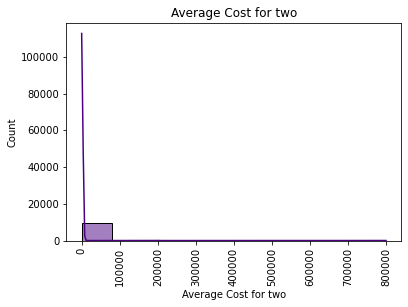

In [778]:
hist_plt(0)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

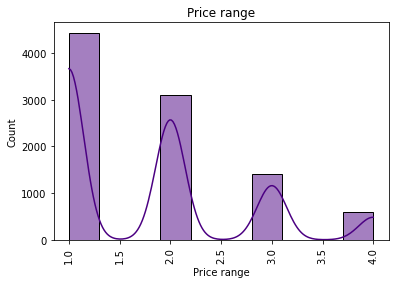

In [779]:
hist_plt(1)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.but s categorical data

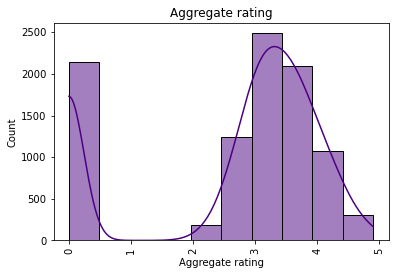

In [780]:
hist_plt(2)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

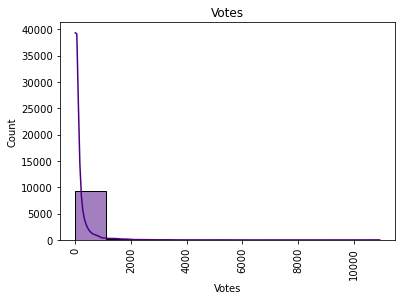

In [781]:
hist_plt(3)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

In [68]:
#Distribution plot for all numerical columns
def count_plt(a):
    plt.figure(figsize = (12, 4))
    plt.title(cat_col[a])
    sns.countplot(cat_col[a],data=data)
    plt.xticks(rotation=90)
    plt.show()
    

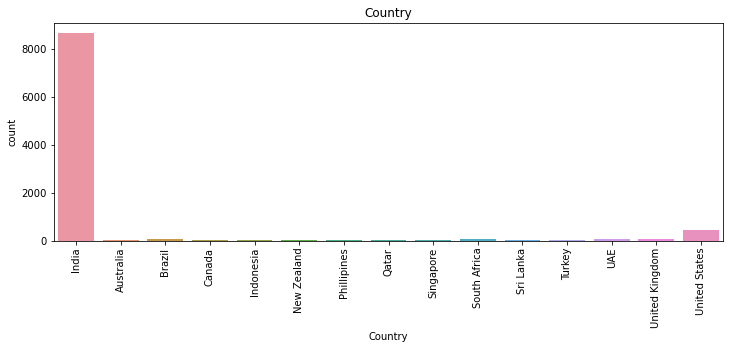

In [69]:
count_plt(0)

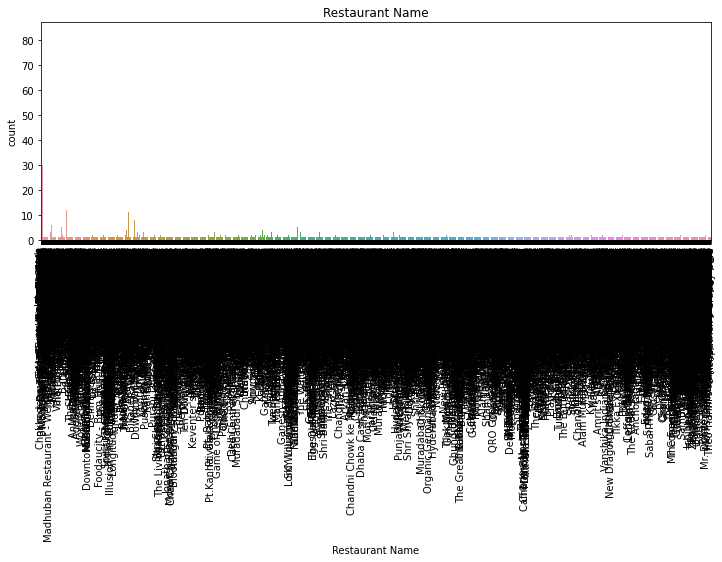

In [70]:
count_plt(1)

Due to the presence of large Restaurents the data is bit diificult to judge.
Domino's Pizza has the highest count with 78 in the column

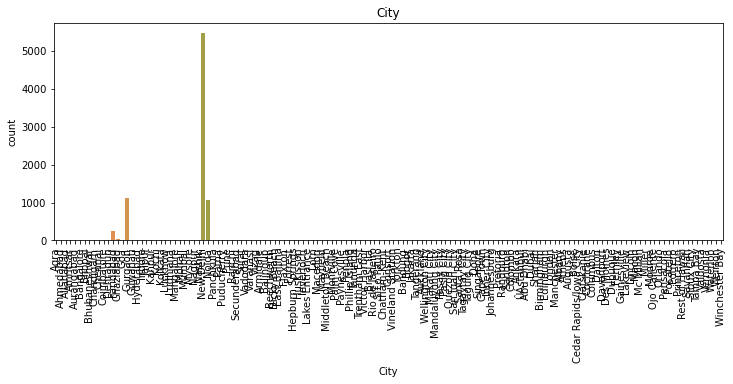

In [71]:
count_plt(2)

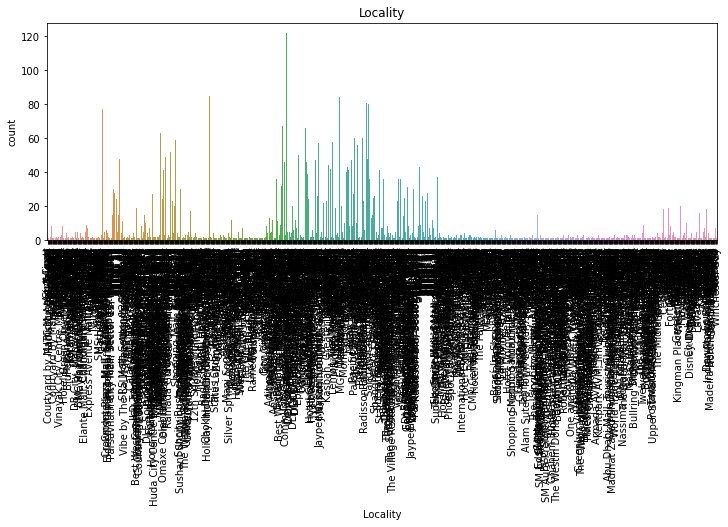

In [72]:
count_plt(4)

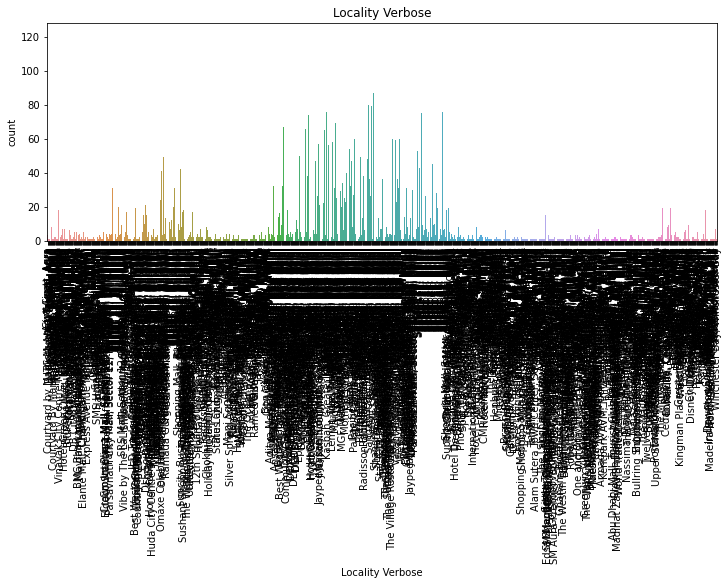

In [73]:
count_plt(5)

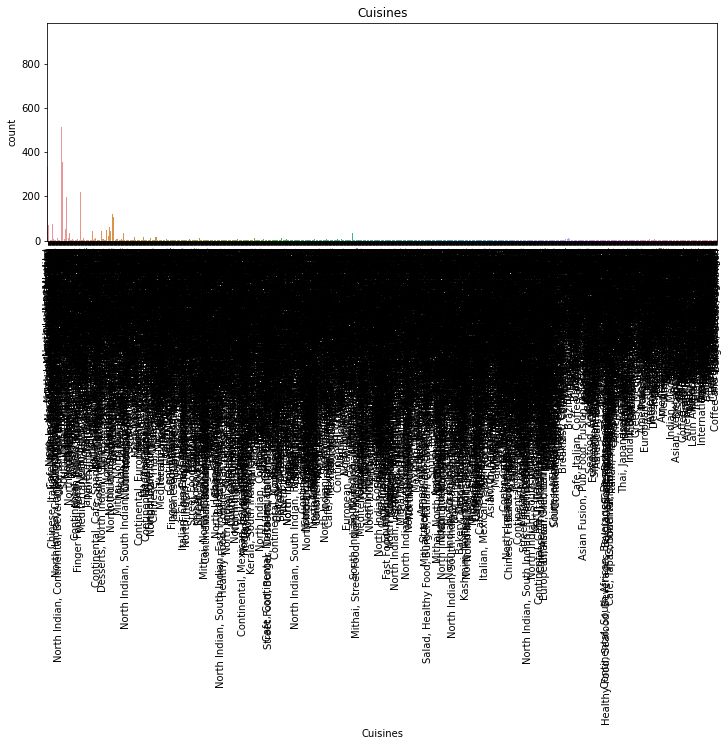

In [74]:
count_plt(6)

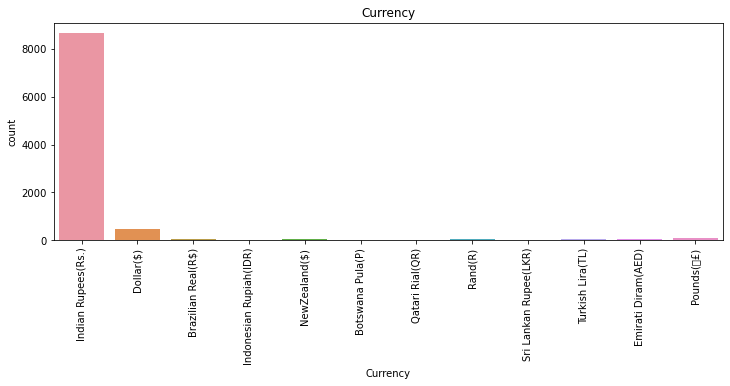

In [75]:
count_plt(7)

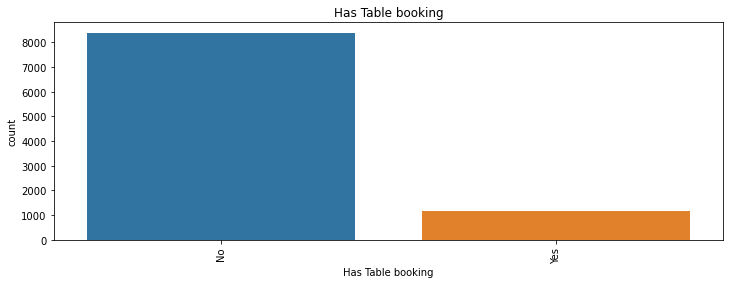

In [76]:
count_plt(8)

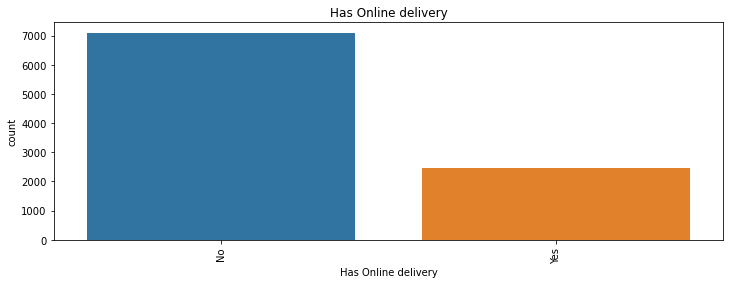

In [77]:
count_plt(9)

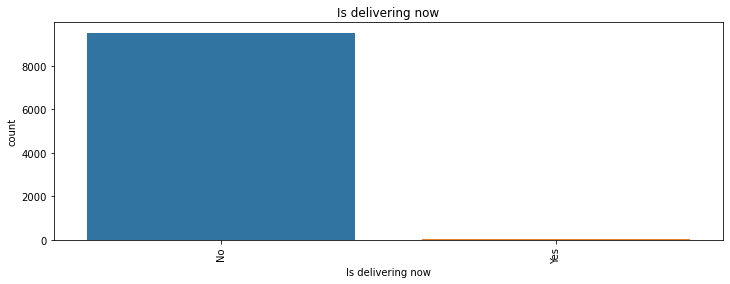

In [78]:
count_plt(10)

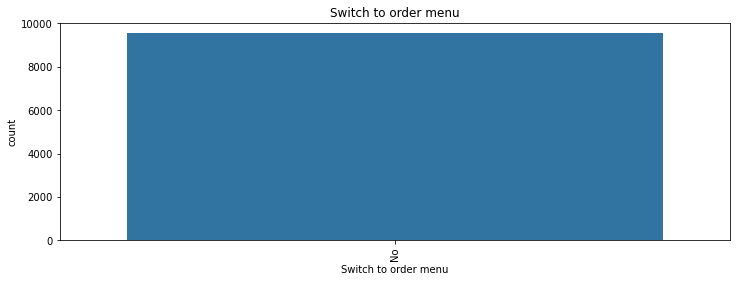

In [79]:
count_plt(11)

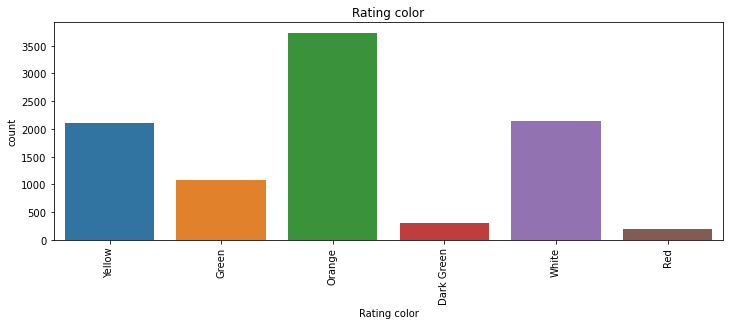

In [80]:
count_plt(12)

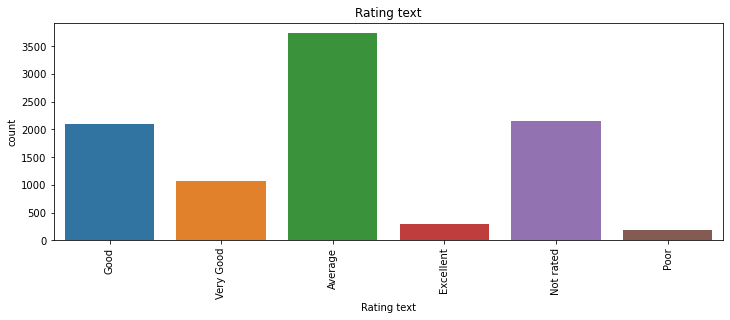

In [81]:
count_plt(13)

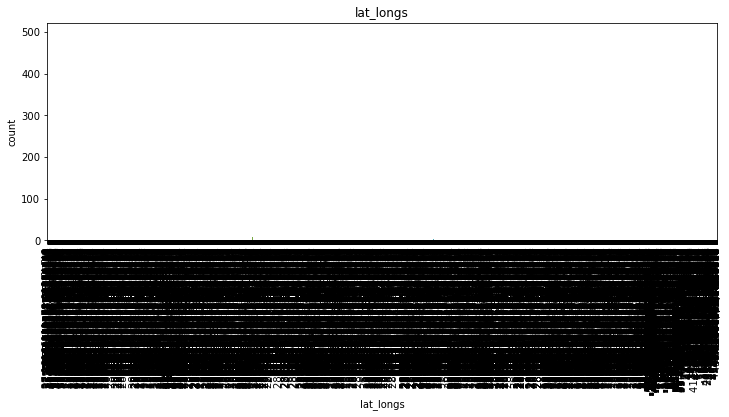

In [82]:
count_plt(14)

We can see large vast data in the column lat_longs

# Bivariate Analysis

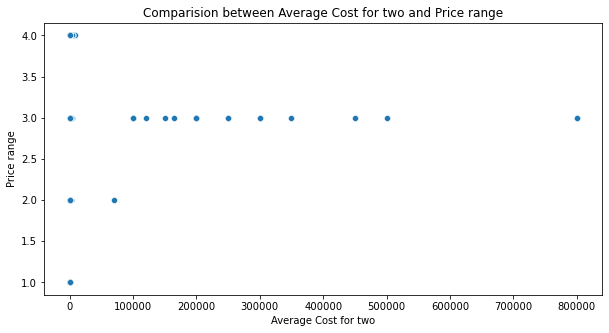

In [83]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Average Cost for two and Price range')
sns.scatterplot(data['Average Cost for two'],data['Price range']);

In [ ]:
#the data is unevenly distributed in the dataset 

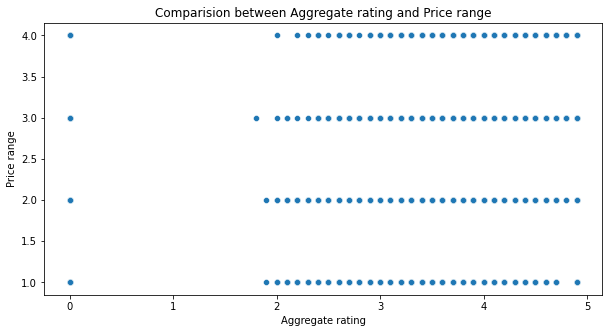

In [84]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Aggregate rating and Price range')
sns.scatterplot(data['Aggregate rating'],data['Price range']);



we are able to see the value of Aggregate rating is normally distributed in the range 2 to 5 ,in thedataset

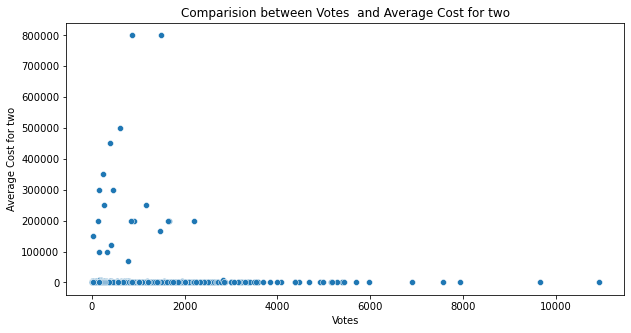

In [85]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Votes  and Average Cost for two')
sns.scatterplot(data['Votes'],data['Average Cost for two']);

In [ ]:
#the data is unevenly distributed in the dataset  and small increase in the Average Cost for two along the votes in the range of 0 to 2000 

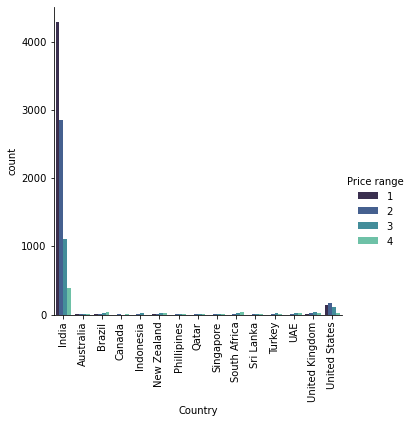

In [102]:
#Factor plot for Country

sns.factorplot('Country',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#we can see high count in the price range india and second higfhest in United states rest all the classification has small counts in the datset

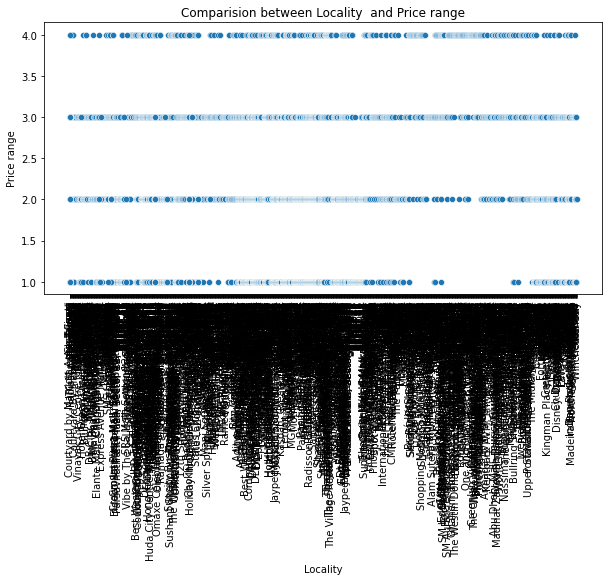

In [87]:

plt.figure(figsize=[10,5])
plt.title('Comparision between Locality  and Price range')
sns.scatterplot(data['Locality'],data['Price range']);
plt.xticks(rotation=90);

In [ ]:
#we are able to see the value of Locality is normally distributed in the range except the price range of 1,in thedataset

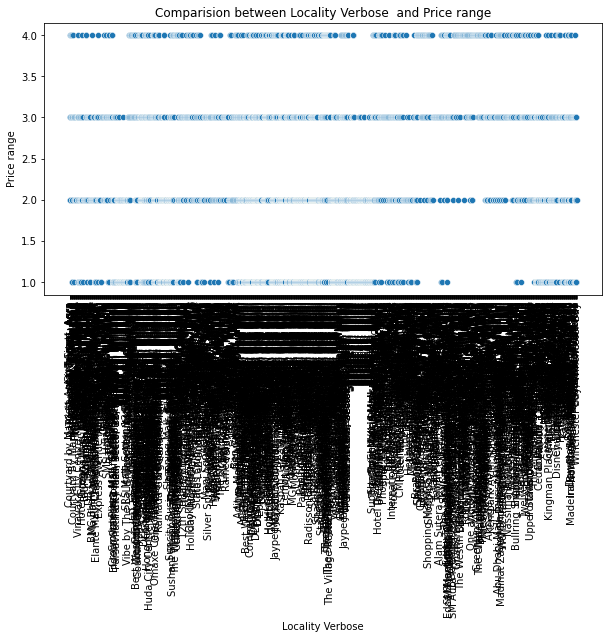

In [88]:



plt.figure(figsize=[10,5])
plt.title('Comparision between Locality Verbose  and Price range')
sns.scatterplot(data['Locality Verbose'],data['Price range']);
plt.xticks(rotation=90);

In [ ]:
#we are able to see the value of Locality verbose is normally distributed in the range except the price range of 1,in thedataset

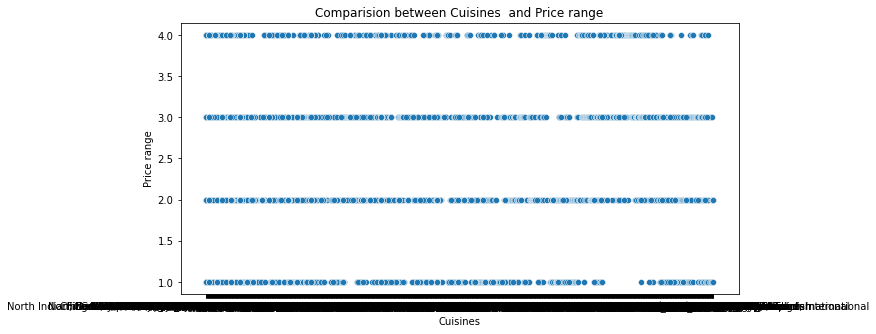

In [89]:

plt.figure(figsize=[10,5])
plt.title('Comparision between Cuisines  and Price range')
sns.scatterplot(data['Cuisines'],data['Price range']);

In [ ]:
#we are able to see the value of cuisines is normally distributed in the dataset

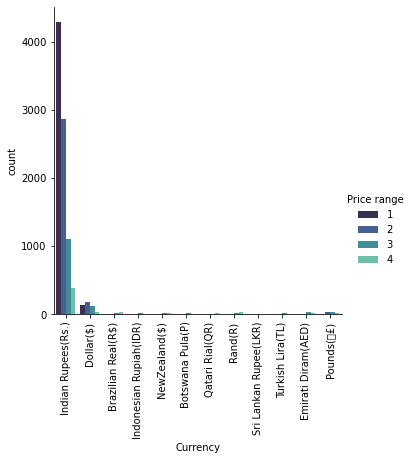

In [90]:
#Factor plot for Currency
sns.factorplot('Currency',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#we can see high count in the price range indian Rupee and second higghest in Dollars rest all the classification has small counts in the datset

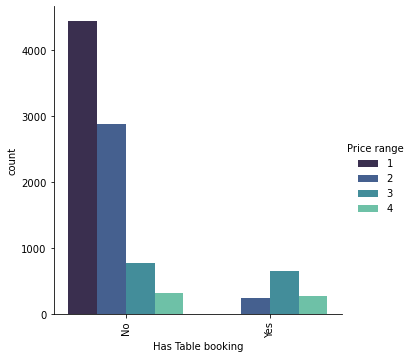

In [91]:
#Factor plot for Has Table booking
sns.factorplot('Has Table booking',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);



In [ ]:
#for the price range one,Two,three has high count in No in Has Table booking compared to the yes in the column and almsot smae count for price range 4.


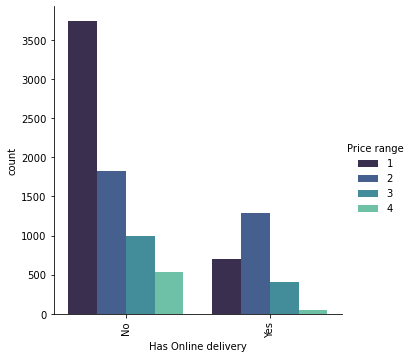

In [92]:
#Factor plot for Has Online delivery
sns.factorplot('Has Online delivery',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#for the price range one,Two,three and four has high count in No in Has online delivery compared to the yes in the column


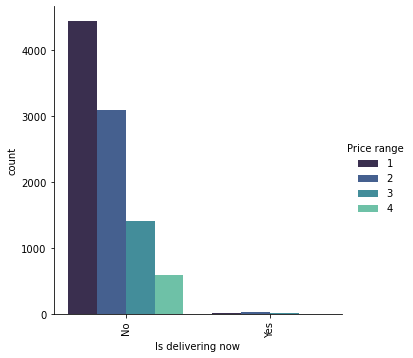

In [93]:
#Factor plot for Is delivering now
sns.factorplot('Is delivering now',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#for the price range one,Two,three and four has high count in No in Is delivering now compared to the yes in the column


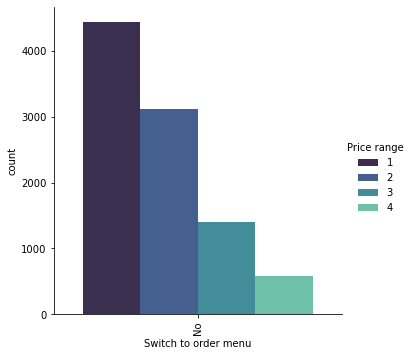

In [94]:

#Factor plot for Switch to order menu
sns.factorplot('Switch to order menu',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#for the price range one,Two,three and four has high count in No in Switch to order menu in the column


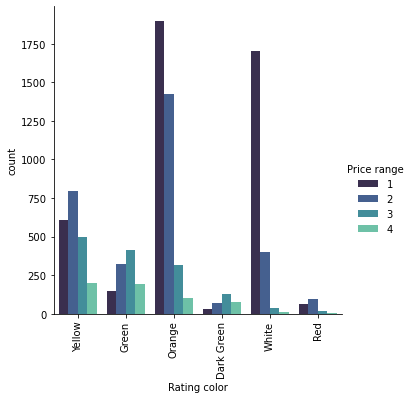

In [95]:

#Factor plot for Rating color
sns.factorplot('Rating color',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#We can observe orange has the highest count for price range one and two and 
#yellow has the highest count in price range 3 and 4

#Dark green has the least count for price range one and two 
#white has the least count for price range 3 and 4

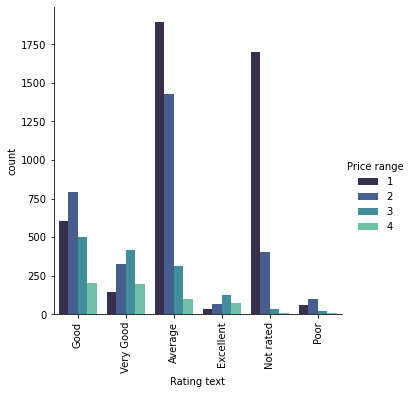

In [96]:
#Factor plot for Rating text
sns.factorplot('Rating text',kind='count',data=data,hue='Price range',palette="mako");
plt.xticks(rotation=90);


In [ ]:
#We can observe Average has the highest count for price range one and two and 
#Good has the highest count in price range 3 and 4

#Excellent has the least count for price range one and two 
#poor has the least count for price range 3 and 4

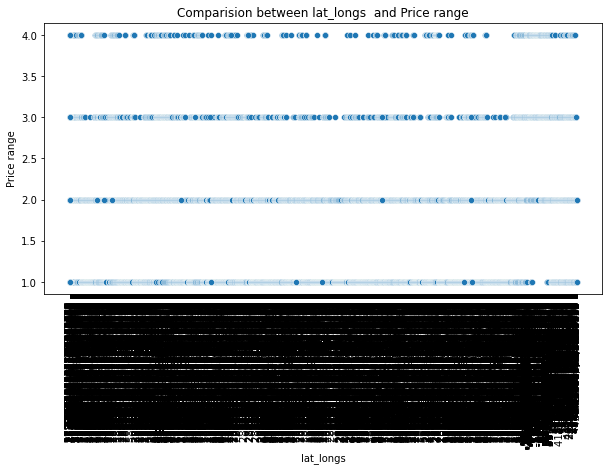

In [97]:

plt.figure(figsize=[10,5])
plt.title('Comparision between lat_longs  and Price range')
sns.scatterplot(data['lat_longs'],data['Price range']);
plt.xticks(rotation=90);

In [ ]:
#we are able to see the value of lat_longs is normally distributed in the dataset

# Multivariate analysis

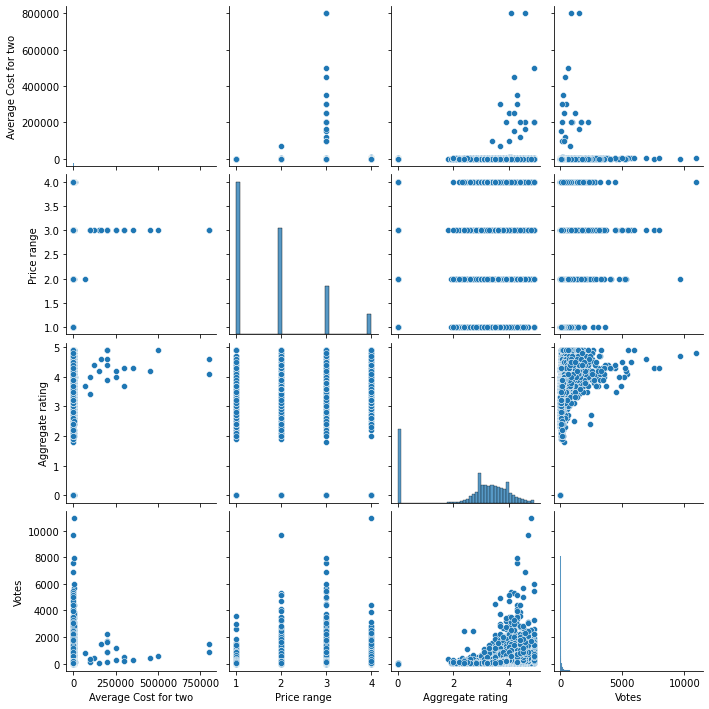

In [98]:
#pair ploting for data
sns.pairplot(data)

Above is the pair plot for the dataset,we can observe some outliers and skewness in the dataset

# Encoding

In [12]:
#Creating list for Encoding the category column in the dataset
categ_col=['Country',
 'Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text']


In [13]:
#Encoding the columns using LabelEncoder

from sklearn.preprocessing import LabelEncoder
#initializing the Encoder
LE=LabelEncoder()
data[categ_col]= data[categ_col].apply(LE.fit_transform)

In [14]:
data['lat_longs']= LE.fit_transform(data['lat_longs'])

In [15]:
data['Price range']=LE.fit_transform(data['Price range'])

In [16]:
data['Price range'].unique()

array([2, 1, 3, 0], dtype=int64)

In [30]:
data.head(50)

,Country,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,lat_longs
0,3,3196,1,4545,17,17,1514,850,4,0,0,0,0,2,3.9,5,2,140,861
1,3,5253,1,4597,17,17,1514,700,4,0,0,0,0,1,3.5,5,2,71,203
2,3,6911,1,6226,17,17,1306,500,4,0,0,0,0,1,3.6,5,2,94,859
3,3,1637,1,100,204,205,1645,400,4,0,0,0,0,1,4.0,1,5,87,866
4,3,4914,1,1311,204,205,1373,1000,4,0,0,0,0,2,4.2,1,5,177,867
5,3,4204,1,4309,226,232,1435,2000,4,0,0,0,0,3,4.0,1,5,45,203
6,3,4892,1,5671,455,461,1514,2500,4,0,0,0,0,3,4.3,1,5,133,860
7,3,6238,1,5671,455,461,1275,2500,4,0,0,0,0,3,4.0,1,5,41,860
8,3,2546,1,1744,532,538,1646,800,4,0,0,0,0,2,3.6,5,2,59,203
9,3,1895,1,7173,826,839,1514,3600,4,0,0,0,0,3,3.8,5,2,46,864


# Outliers visulaization

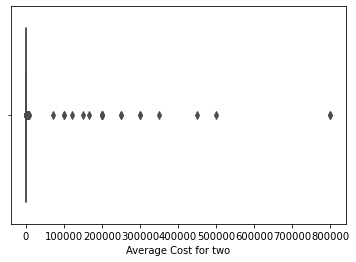

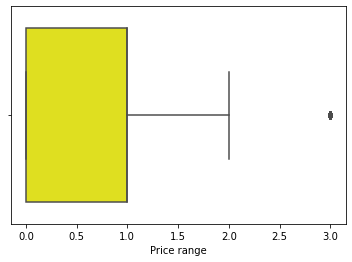

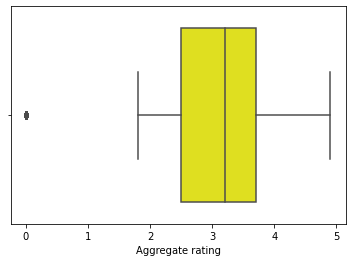

In [75]:
def bxplt(a):
    plt.figure()
    sns.boxplot(data[con_col[a]],data=data,color='yellow')
for i in range(0,3):
    bxplt(i)

We can observe outliers in the columns 'Average Cost for two', 'Aggregate rating', 'Votes' and we can ignore the outliers in the categorical data columns

In [17]:
#creating dataset for removing outliers in the dataset
feat=data[['Average Cost for two', 'Aggregate rating', 'Votes']]

In [18]:
#zscore
z1=np.abs(zscore(feat))
threshold=3

In [19]:
#printing the outliers points in the dataset

print(np.where(z1>3))

(array([  20,  102,  103,  104,  107,  111,  112,  115,  119,  169,  181,
        183,  187,  189,  190,  191,  193,  197,  200,  520,  523,  539,
        611,  623,  624,  627,  628,  629,  631,  632,  634,  840,  930,
        931, 1215, 1237, 1242, 1676, 1678, 1680, 1683, 1687, 1690, 1714,
       1720, 1778, 1780, 1782, 1785, 1786, 1787, 1788, 1789, 1790, 1792,
       1856, 1859, 1860, 1861, 1864, 1866, 1868, 1871, 1875, 2011, 2256,
       2381, 2384, 2389, 2392, 2394, 2401, 2402, 2404, 2409, 2417, 2425,
       2431, 2432, 2433, 2436, 2444, 2451, 2456, 2459, 2461, 2469, 2470,
       2471, 2477, 2483, 2486, 2488, 2491, 2492, 2493, 2494, 2495, 2692,
       2695, 2712, 2713, 2714, 2814, 2964, 2965, 2975, 2977, 2981, 3352,
       3359, 3360, 3362, 3368, 3369, 3370, 3374, 3463, 3538, 3554, 3696,
       3762, 4014, 4015, 4025, 4049, 4383, 4402, 5520, 5693, 5910, 6035,
       6077, 6085, 6088, 6224, 6297, 6373, 6409, 6421, 6463, 7239, 7770,
       7810, 8533, 8537, 8541, 8543, 8545, 8547, 8

In [20]:
#saving the data without outlier points 
dfnew_2=data[(z1<3).all(axis=1)]


In [21]:
#chcking df loss
df_loss=((data.shape[0]-dfnew_2.shape[0])/data.shape[0])*100
print(df_loss)

1.9807168308530707


In [ ]:
#Since datasloss is less than 10% it is allowable

In [82]:
Q1=feat.quantile(.25)
Q3=feat.quantile(.75)

IQR=Q3-Q1


In [83]:
df_new_2=dfnew_2[~(( data<(Q1-1.5*IQR ))|(data>(Q1+1.5*IQR))).any(axis=1)]

In [84]:
df_new_2.shape

(4850, 19)

In [85]:
#checking data loss
((data.shape[0])-(df_new_2.shape[0]))/(data.shape[0])*100

49.17208132466988

In [ ]:
#high data loss so we cannot loose this much data loss in IQR method

In [22]:
#Updataing the dataset with out outliers
data=dfnew_2

In [27]:
data.shape

(9353, 20)

In [88]:
data

,Country,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,lat_longs
0,3,3196,1,4545,17,17,1514,850,4,0,0,0,0,2,3.9,5,2,140,861
1,3,5253,1,4597,17,17,1514,700,4,0,0,0,0,1,3.5,5,2,71,203
2,3,6911,1,6226,17,17,1306,500,4,0,0,0,0,1,3.6,5,2,94,859
3,3,1637,1,100,204,205,1645,400,4,0,0,0,0,1,4.0,1,5,87,866
4,3,4914,1,1311,204,205,1373,1000,4,0,0,0,0,2,4.2,1,5,177,867
5,3,4204,1,4309,226,232,1435,2000,4,0,0,0,0,3,4.0,1,5,45,203
6,3,4892,1,5671,455,461,1514,2500,4,0,0,0,0,3,4.3,1,5,133,860
7,3,6238,1,5671,455,461,1275,2500,4,0,0,0,0,3,4.0,1,5,41,860
8,3,2546,1,1744,532,538,1646,800,4,0,0,0,0,2,3.6,5,2,59,203
9,3,1895,1,7173,826,839,1514,3600,4,0,0,0,0,3,3.8,5,2,46,864


In [103]:
#distribution plot

def dtp(a):
    plt.figure()
    sns.distplot(data[con_col[a]],color='brown',bins=5)
    

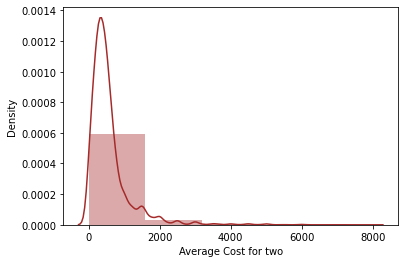

In [90]:
dtp(0)

In [ ]:
#the data looks right skewed and teh building block is out of the normalized curve

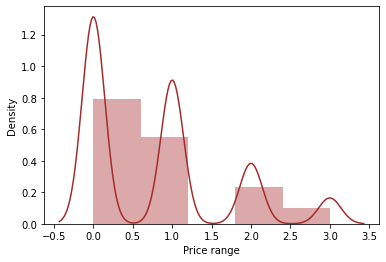

In [91]:
dtp(1)

In [ ]:
#the data looks  skewed and teh building block is out of the normalized curve.but it is categorical Data

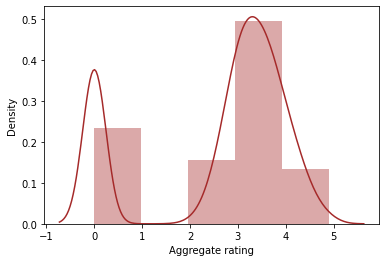

In [92]:
dtp(2)

In [ ]:
#the data looks right skewed and teh building block is out of the normalized curve

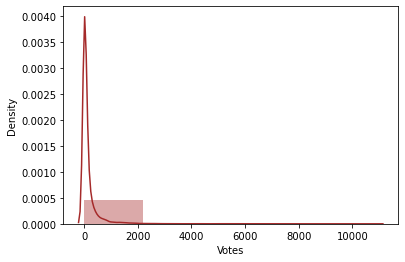

In [104]:
dtp(3)

In [ ]:
#the data looks right  skewed and the building block is out of the normalized curve

# skewness Removal

In [23]:
#initialising X and y
X1=data.drop(['Price range'],axis=1)
y1=data['Price range']

In [24]:
X1.skew()

Country Code             3.095193
Country                  3.352847
Restaurant Name          0.048030
City                    -1.206087
Address                 -0.046810
Locality                -0.266586
Locality Verbose        -0.195202
Cuisines                -0.306247
Average Cost for two     3.620465
Currency                 2.906753
Has Table booking        2.380822
Has Online delivery      1.118600
Is delivering now       16.497854
Switch to order menu     0.000000
Aggregate rating        -0.939831
Rating color             0.047533
Rating text              0.434197
Votes                    3.219845
lat_longs                0.040146
dtype: float64

In [25]:
cont_col=['Average Cost for two','Aggregate rating','Votes']

In [26]:
X1[cont_col].skew()


Average Cost for two    3.620465
Aggregate rating       -0.939831
Votes                   3.219845
dtype: float64

In [27]:
#creating a list for removing skewness in the data
features=['Average Cost for two','Aggregate rating','Votes']

In [28]:
#removing skewness
X1[features]=PowerTransformer(method='yeo-johnson').fit_transform(X1[features])

In [29]:
#checking the updated Skewness
X1[features].skew()

Average Cost for two    0.081791
Aggregate rating       -0.615638
Votes                  -0.021212
dtype: float64

<AxesSubplot:xlabel='Aggregate rating', ylabel='Density'>

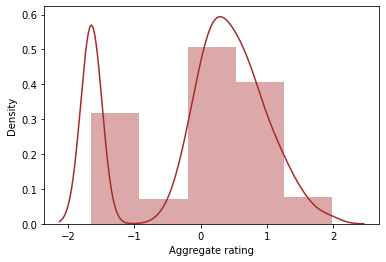

In [30]:
sns.distplot(X1['Aggregate rating'],color='brown',bins=5)

In [31]:
features=['Aggregate rating']
X1[features]=PowerTransformer(method='yeo-johnson').fit_transform(X1[features])

In [37]:
X1['Aggregate rating'].skew()

0.02766989573438068

In [105]:
#the skewness in the dataset is removed completely

# Checking For Multicollinearity

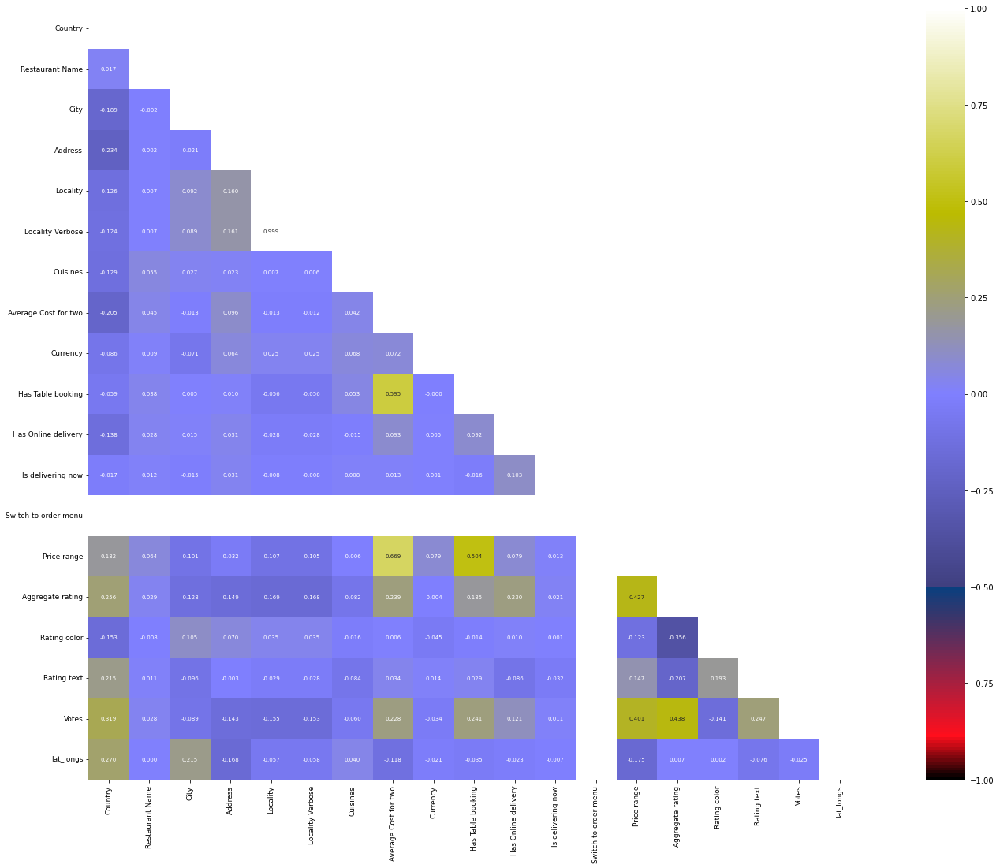

In [104]:
data_cor=data.corr()
upper_triangle = np.triu(data_cor)
plt.figure(figsize=(30,18))
sns.heatmap(data_cor, vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':7}, cmap="gist_stern", mask=upper_triangle)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.show()

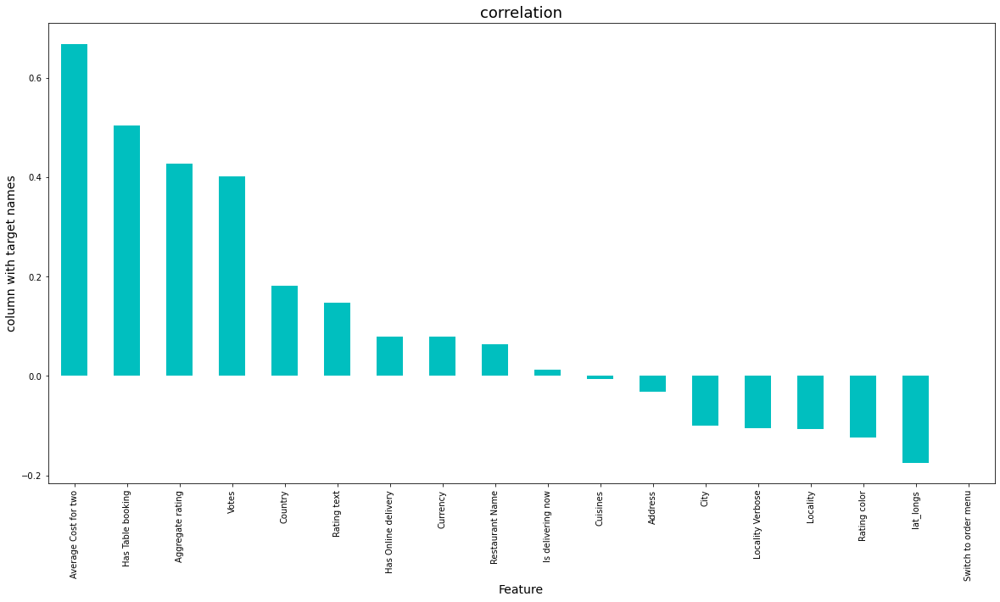

In [105]:
plt.figure(figsize=(20,10))
data.corr()['Price range'].sort_values(ascending=False).drop(['Price range']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

# Scaling the data

In [32]:
scaler=StandardScaler()
X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

In [33]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
2,1.007992,Restaurant Name
12,1.014311,Is delivering now
7,1.050599,Cuisines
4,1.127977,Address
16,1.164690,Rating text
9,1.178891,Currency
3,1.180873,City
11,1.216565,Has Online delivery
15,1.262189,Rating color
18,1.354071,lat_longs


In [ ]:
#the vif is more than 10.lets drop the the column iteratively for removing multicollinearity.

In [34]:
#droping the highest multicollinear feature
X1.drop('Locality',axis=1,inplace=True)

In [35]:
#checking the updated feature for Multicollinearity

X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
2,1.007980,Restaurant Name
11,1.014310,Is delivering now
6,1.050275,Cuisines
5,1.070121,Locality Verbose
4,1.126548,Address
15,1.164594,Rating text
3,1.173527,City
8,1.177632,Currency
10,1.215774,Has Online delivery
14,1.261497,Rating color


the vif values are less than 10.So multicollinearity is removed

# Oversampling with SMOTE

In [36]:
y1.value_counts()

0    4431
1    3075
2    1294
3     553
Name: Price range, dtype: int64

In [ ]:
#Able to observe Imbalance in the target variable in the datset

In [37]:
#removiing imbalance using Overfitting

from imblearn.over_sampling import SMOTE
SM = SMOTE()
X1,y1 = SM.fit_resample(X1,y1)

In [38]:
# Checking the updated value counts 
y1.value_counts()

2    4431
1    4431
3    4431
0    4431
Name: Price range, dtype: int64

# The dataset is balanced Now

# Model Building

In [113]:
X1.head()

,Country,Restaurant Name,City,Address,Locality Verbose,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Aggregate rating,Rating color,Rating text,Votes,lat_longs
0,-0.274131,-0.210504,-3.382154,-0.002301,-2.008584,1.020217,0.814094,0.021339,-0.364329,-0.586528,-0.060402,0.0,0.990362,1.371179,0.144015,0.862855,-1.273082
1,-0.274131,0.751844,-3.382154,0.017972,-2.008584,1.020217,0.575072,0.021339,-0.364329,-0.586528,-0.060402,0.0,0.444402,1.371179,0.144015,0.503666,-1.527754
2,-0.274131,1.527523,-3.382154,0.653061,-2.008584,0.615925,0.186294,0.021339,-0.364329,-0.586528,-0.060402,0.0,0.571177,1.371179,0.144015,0.650841,-1.273856
3,-0.274131,-0.939867,-3.382154,-1.735248,-1.438693,1.274844,-0.054757,0.021339,-0.364329,-0.586528,-0.060402,0.0,1.143363,-1.344179,1.932034,0.610069,-1.271147
4,-0.274131,0.593246,-3.382154,-1.263122,-1.438693,0.746153,1.022889,0.021339,-0.364329,-0.586528,-0.060402,0.0,1.469852,-1.344179,1.932034,0.989282,-1.270760


In [39]:
#finding best random_state

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X1,y1,test_size=.30,random_state=i)
    lg=LogisticRegression()
    lg.fit(x_train,y_train)
    predlg=lg.predict(x_test)
    acc=accuracy_score(y_test,predlg)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)

Best accuracy is  0.8866115080857465  on random_state  114


In [40]:
x_train,x_test,y_train,y_test=train_test_split(X1,y1,test_size=.30,random_state=maxRS)

In [41]:
# different algorithm going to use
lg=LogisticRegression()
knn=KNeighborsClassifier()
svc=SVC()
dtc=DecisionTreeClassifier()
rf=RandomForestClassifier()
ada=AdaBoostClassifier()
gd=GradientBoostingClassifier()

etc=ExtraTreesClassifier()

In [42]:
#code for Training and Prediction 

def evaluate(x):
    model=x
    print(model)
    #training the model
    model.fit(x_train,y_train)
    pred_train=model.predict(x_train)
    #model prediction
    pred=model.predict(x_test)
    
    print("train accuracy score is {:.2f}%".format(accuracy_score(y_train,pred_train)*100))
    print("test accuracy score is {:.2f}%".format(accuracy_score(y_test,pred)*100))
    
    print("\n")
    print("Confusion Matrix : \n",confusion_matrix(y_test,pred))
    print("\n")
    print("Classification Report  : \n",classification_report(y_test,pred))

In [118]:
#calling LogisticRegressionClassifier
evaluate(lg)

LogisticRegression()
train accuracy score is 72.55%
test accuracy score is 74.48%


Confusion Matrix : 
 [[1131  137   25    1]
 [  97 1001  190   45]
 [  46  181  812  284]
 [  57   33  261 1017]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.85      0.87      0.86      1294
           1       0.74      0.75      0.75      1333
           2       0.63      0.61      0.62      1323
           3       0.76      0.74      0.75      1368

    accuracy                           0.74      5318
   macro avg       0.74      0.75      0.74      5318
weighted avg       0.74      0.74      0.74      5318



In [119]:
#calling KNeighborsClassifier
evaluate(knn)


KNeighborsClassifier()
train accuracy score is 91.21%
test accuracy score is 85.71%


Confusion Matrix : 
 [[1047  231   14    2]
 [ 149 1021  147   16]
 [   1   90 1156   76]
 [   0    1   33 1334]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.87      0.81      0.84      1294
           1       0.76      0.77      0.76      1333
           2       0.86      0.87      0.86      1323
           3       0.93      0.98      0.95      1368

    accuracy                           0.86      5318
   macro avg       0.86      0.86      0.86      5318
weighted avg       0.86      0.86      0.86      5318



In [120]:
#calling SVC Classifier
evaluate(svc)

SVC()
train accuracy score is 94.53%
test accuracy score is 92.78%


Confusion Matrix : 
 [[1209   79    6    0]
 [  19 1210   98    6]
 [   1   40 1204   78]
 [   0    2   55 1311]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.98      0.93      0.96      1294
           1       0.91      0.91      0.91      1333
           2       0.88      0.91      0.90      1323
           3       0.94      0.96      0.95      1368

    accuracy                           0.93      5318
   macro avg       0.93      0.93      0.93      5318
weighted avg       0.93      0.93      0.93      5318



In [121]:
#calling DecisionTreeClassifier
evaluate(dtc)

DecisionTreeClassifier()
train accuracy score is 100.00%
test accuracy score is 97.89%


Confusion Matrix : 
 [[1289    5    0    0]
 [   7 1307   17    2]
 [   0   18 1276   29]
 [   0    1   33 1334]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      1294
           1       0.98      0.98      0.98      1333
           2       0.96      0.96      0.96      1323
           3       0.98      0.98      0.98      1368

    accuracy                           0.98      5318
   macro avg       0.98      0.98      0.98      5318
weighted avg       0.98      0.98      0.98      5318



In [137]:
#calling RandomForestClassifier
evaluate(rf)

RandomForestClassifier()
train accuracy score is 100.00%
test accuracy score is 98.93%


Confusion Matrix : 
 [[1288    6    0    0]
 [   5 1313   15    0]
 [   0    9 1309    5]
 [   0    0   17 1351]]


Classification Report  : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1294
           1       0.99      0.98      0.99      1333
           2       0.98      0.99      0.98      1323
           3       1.00      0.99      0.99      1368

    accuracy                           0.99      5318
   macro avg       0.99      0.99      0.99      5318
weighted avg       0.99      0.99      0.99      5318



In [123]:
#calling AdaBoostClassifier
evaluate(ada)

AdaBoostClassifier()
train accuracy score is 75.00%
test accuracy score is 73.82%


Confusion Matrix : 
 [[1252    1   41    0]
 [  23 1213   94    3]
 [   0   90 1154   79]
 [   0   33 1028  307]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.98      0.97      0.97      1294
           1       0.91      0.91      0.91      1333
           2       0.50      0.87      0.63      1323
           3       0.79      0.22      0.35      1368

    accuracy                           0.74      5318
   macro avg       0.79      0.74      0.72      5318
weighted avg       0.79      0.74      0.71      5318



In [124]:
#calling GradientBoostingClassifier
evaluate(gd)

GradientBoostingClassifier()
train accuracy score is 98.38%
test accuracy score is 97.39%


Confusion Matrix : 
 [[1293    1    0    0]
 [  15 1299   18    1]
 [   0   32 1269   22]
 [   0    1   49 1318]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.99      1.00      0.99      1294
           1       0.97      0.97      0.97      1333
           2       0.95      0.96      0.95      1323
           3       0.98      0.96      0.97      1368

    accuracy                           0.97      5318
   macro avg       0.97      0.97      0.97      5318
weighted avg       0.97      0.97      0.97      5318



In [125]:
#calling XGBClassifier
evaluate(xgb)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...)
train accuracy score is 100.00%
test accuracy score is 99.00%


Confusion Matrix : 
 [[1294    0    0    0]
 [   7 1314   12    0]
 [   0   10 1303   10]
 [   0    0   14 1354]]


Classification Report  : 
               precision    recall  f1-score   suppor

In [126]:
#calling Extra tree Classifier
evaluate(etc)

ExtraTreesClassifier()
train accuracy score is 100.00%
test accuracy score is 97.84%


Confusion Matrix : 
 [[1270   24    0    0]
 [  10 1281   39    3]
 [   0   17 1292   14]
 [   0    0    8 1360]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.99      0.98      0.99      1294
           1       0.97      0.96      0.96      1333
           2       0.96      0.98      0.97      1323
           3       0.99      0.99      0.99      1368

    accuracy                           0.98      5318
   macro avg       0.98      0.98      0.98      5318
weighted avg       0.98      0.98      0.98      5318



In [127]:
model=[lg,knn,svc,dtc,rf,ada,gd,etc]

for m in model:
    score=cross_val_score(xgb,X1,y1,cv=5)
    print(m,"Cross val score is ",score*100,"   ")
    print("mean is ",score.mean()*100,"\n\n")

LogisticRegression() Cross val score is  [66.48801128 69.56276446 75.37376587 69.3370945  71.75507901]    
mean is  70.50334302279305 


KNeighborsClassifier() Cross val score is  [72.91960508 81.46685472 84.90832158 82.25669958 83.71896163]    
mean is  81.0540885168759 


SVC() Cross val score is  [89.64739069 92.04513399 95.59943583 87.41889986 90.29345372]    
mean is  91.00086281826373 


DecisionTreeClassifier() Cross val score is  [78.44851904 97.57404795 98.64598025 96.50211566 93.62302483]    
mean is  92.9587375472401 


RandomForestClassifier() Cross val score is  [95.37376587 98.89985896 99.60507757 95.7122708  94.77990971]    
mean is  96.87417658164776 


AdaBoostClassifier() Cross val score is  [53.00423131 76.50211566 75.03526093 67.58815233 69.21557562]    
mean is  68.2690671692875 


GradientBoostingClassifier() Cross val score is  [95.99435825 97.03808181 98.58956276 95.4583921  93.3972912 ]    
mean is  96.09553722376285 


ExtraTreesClassifier() Cross val score is

In [129]:
score=cross_val_score(xgb,X1,y1,cv=5)
print(xgb,"Cross val score is ",score*100,"   ")
print("mean is ",score.mean()*100,"\n\n")

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...) Cross val score is  [92.38363893 98.98448519 99.63328632 97.09449929 94.63882619]    
mean is  96.5469471834237 




# The Best model with least difference in Test accuracy(97.39%) and Cross validation of 96.095% and difference of 1.2944% is GradientBoostingClassifier

In [47]:
#parameters of GradientBoostingClassifier 
    
grid_params = {
    'max_features':['auto','sqrt','log2'],
    "n_estimators":[50,100,150],
    "max_depth":[3,5,7],
    "learning_rate":[0.001,0.01,0.1,1]
}

In [44]:
from sklearn.model_selection import GridSearchCV

grid_search= GridSearchCV(estimator=gd,param_grid=grid_params,cv= 5,n_jobs=-1)

In [45]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1],
                         'max_depth': [3, 5, 7],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 150]})

In [46]:
grid_search.best_params_

{'learning_rate': 0.1,
 'max_depth': 7,
 'max_features': 'sqrt',
 'n_estimators': 150}

In [50]:
h_gd=GradientBoostingClassifier(learning_rate=0.1,max_features='sqrt',max_depth=7,
                           n_estimators=150)


In [51]:
#calling GradientBoostingClassifier
evaluate(h_gd)

GradientBoostingClassifier(max_depth=7, max_features='sqrt', n_estimators=150)
train accuracy score is 100.00%
test accuracy score is 98.66%


Confusion Matrix : 
 [[1283    3    0    0]
 [   2 1307   27    3]
 [   0   14 1364    7]
 [   0    0   15 1293]]


Classification Report  : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1286
           1       0.99      0.98      0.98      1339
           2       0.97      0.98      0.98      1385
           3       0.99      0.99      0.99      1308

    accuracy                           0.99      5318
   macro avg       0.99      0.99      0.99      5318
weighted avg       0.99      0.99      0.99      5318



In [ ]:
#Because of Multicalssification problem not working on ROc-Auc curve

# The hyper parameter tuning of GradientBoostingClassifier  gives actual accuracy of 97.39 % and cross val of  96.095%. Since there is accuracy increase of more than 1% for hypertuned parameter.

# The hypertuned model of GradientBoostingClassifier algorithm is selected for final output with accuracy of 98.66%.

In [53]:
joblib.dump(h_gd,"Price_Range_Zomato.obj")

['Price_Range_Zomato.obj']

In [54]:
#Lets Check loading the file 

Price_Range_Zomato_prediction=joblib.load("Price_Range_Zomato.obj")

In [55]:
pred=h_gd.predict(x_test)
Conclusion=pd.DataFrame([Price_Range_Zomato_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])

In [56]:
Conclusion

,0,1,2,3,4,5,6,7,8,9,...,5308,5309,5310,5311,5312,5313,5314,5315,5316,5317
Predicted,0,1,3,3,0,3,3,3,3,2,...,2,1,2,2,2,1,1,1,0,0
Original,0,1,3,3,0,3,3,3,3,2,...,2,1,2,2,2,1,1,1,0,0


we can see it is giving exact data as result. The model is working well.The datas predicted are perfectly matching. The jobfile created is working well giving good accuracy.

After Training and Testing Eight algorithm model. The best accuracy model was determined as KNeighborsClassifier (hypertuned model) with 93.55% true accuracy after all the data cleaning, pre-processing, training and prediction as well

# the models are created for both subcategories